# Mapping Allen institute scRNA-seq reference to Visium spatial (mouse brain)

## Contents:
* [Loading packages](#Loading_packages)
* [Loading Visium data](#read_visium)
* [Loading Allen single cell reference data](#read_allen)


* [cell2location analysis](#cell2location)
* [Loading cell2location results](#cell2location_res)
* [Evaluate mapping accuracy by comparing to Allen](#mapping_accuracy)


* [Fig 2J](#Fig2J)
* [Fig 2J supplementary spatial maps](#suppl_spatial_maps)

### Loading packages <a class="anchor" id="Loading_packages"></a>

In [1]:
import sys, ast, os
import time
import pickle
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import os
from plotnine import *
import matplotlib.pyplot as plt 
import scipy.sparse as ss
import h5py
import matplotlib as mpl
data_type = 'float32'

# this line should go before importing cell2location
os.environ["THEANO_FLAGS"] = 'device=cuda,floatX=' + data_type + ',force_device=True'

sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/BayraktarLab/cell2location/')
sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/cell2location_dev/')

import cell2location
from cell2location.plt.plot_heatmap import clustermap

from matplotlib import rcParams
import seaborn as sns
import glob

# scanpy prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text

/opt/conda/envs/cellpymc/lib/python3.7/site-packages/theano/gpuarray/dnn.py:184: UserWarning: Your cuDNN version is more recent than Theano. If you encounter problems, try updating Theano or downgrading cuDNN to a version >= v5 and <= v7.
Using cuDNN version 7605 on context None
Mapped name None to device cuda: Tesla V100-SXM2-32GB (0000:89:00.0)


`THEANO_FLAGS='force_device=True'` forces the package to use GPU. Pay attention to error messages that might indicate theano failed to initalise the GPU.   
Do not forget to change `device=cuda0` to your available GPU id. Use `device=cuda` / `device=cuda0` if you have just one locally or if you are requesting one GPU via HPC cluster job.    
You should see a message similar to the one below confirming that `theano` started using the GPU:
```
Using cuDNN version 7605 on context None
Mapped name None to device cuda0: Tesla V100-SXM2-32GB (0000:89:00.0)
```

## Loading Visium data <a class="anchor" id="read_visium"></a>

First let's read spatial Visium data from 10X Space Ranger output. Here we load sample annotations.

In [2]:
sp_data_folder = '/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_data/mouse_visium_data/'
sc_data_folder = '/nfs/team205/vk7/sanger_projects/large_data/mouse_zeisel/'
results_folder = '/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/zeisel/'
vis_results_folder = '/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/mouse_visium_snrna/'

sample_data = pd.read_csv(sp_data_folder + 'Visium_mouse.csv')

In [3]:
sample_data

,sample_name,sample_name2,image_name,slide,position
0,ST8059048,Visium-28C,mouse_brain_he_Library_028_C05717_020_C1_14460...,C05717-020,C1
1,ST8059049,Visium-28D,mouse_brain_he_Library_028_C05717_020_D1_14460...,C05717-020,D1
2,ST8059050,Visium-28E,mouse_brain_he_Library_028_C05717_020_E1_14460...,C05717-020,E1
3,ST8059051,Visium-29B,mouse_brain_he_Library_029_C05717_021_B1_14460...,C05717-021,B1
4,ST8059052,Visium-29C,mouse_brain_he_Library_029_C05717_021_C1_14460...,C05717-021,C1


Next we load the mRNA count for each Visium slide and corresponding histology images as a list `slides` and as a single anndata object `adata`. We need this redundancy because scanpy plotting over the histology image does not work with multiple sections.   

In [4]:
def read_and_qc(sample_name, path=sp_data_folder + 'rawdata/'):
    
    adata = sc.read_visium(path + str(sample_name),
                           count_file='filtered_feature_bc_matrix.h5', load_images=True)
    adata.obs['sample'] = sample_name
    adata.var['SYMBOL'] = adata.var_names
    adata.var.rename(columns={'gene_ids': 'ENSEMBL'}, inplace=True)
    adata.var_names = adata.var['ENSEMBL']
    adata.var.drop(columns='ENSEMBL', inplace=True)

    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.var['mt'] = [gene.startswith('mt-') for gene in adata.var['SYMBOL']]
    adata.obs['mt_frac'] = adata[:, adata.var['mt'].tolist()].X.sum(1).A.squeeze()/adata.obs['total_counts']
    
    # add sample name to obs names
    adata.obs["sample"] = [str(i) for i in adata.obs['sample']]
    adata.obs_names = adata.obs["sample"] \
                          + '_' + adata.obs_names
    adata.obs.index.name = 'spot_id'
    
    return adata

# read first sample
adata = read_and_qc(sample_data['sample_name'][0],
                    path=sp_data_folder + 'rawdata/') 

# read the remaining samples
slides = {}
for i in sample_data['sample_name'][1:]:
    adata_1 = read_and_qc(i, path=sp_data_folder + 'rawdata/') 
    slides[str(i)] = adata_1

adata_0 = adata.copy()
    
# combine individual samples
#adata = adata.concatenate(list(slides.values()), index_unique=None)
adata = adata.concatenate(
    list(slides.values()),
    batch_key="sample",
    uns_merge="unique",
    batch_categories=list(sample_data['sample_name'].values), 
    index_unique=None
)

obs = adata.obs.merge(sample_data, left_on='sample', right_on='sample_name')
obs.index = adata.obs_names
adata.obs = obs

slides[str(sample_data['sample_name'][0])] = adata_0

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [5]:
# read in manual SSp cortical layer annotations
lay = pd.DataFrame()
for s in slides.keys():
    
    lay_file = vis_results_folder + 'manual_SSp_layers/SSp_ManLayerAnn_' \
                + str(s) + '.csv'
    lay_ = pd.read_csv(lay_file, index_col='Barcode')
    lay_.index = [str(s) + '_' + i for i in lay_.index]
    lay = pd.concat([lay, lay_])
    
    slides[s].obs['SSp_manual_layers'] = lay_.reindex(index=slides[s].obs_names)
    
adata.obs['SSp_manual_layers'] = lay.reindex(index=adata.obs_names) 

In [6]:
adata.obs['SSp_manual_layers'].isna().sum()

13575

... storing 'sample' as categorical
... storing 'SSp_manual_layers' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


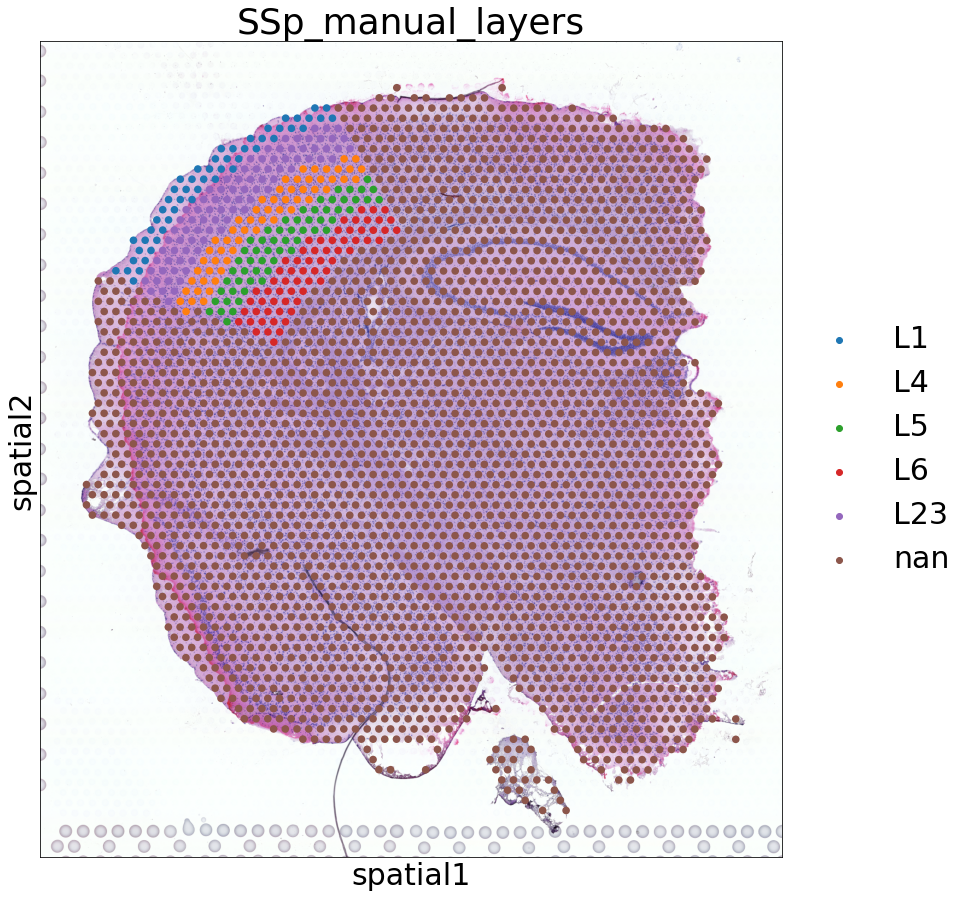

In [7]:
with mpl.rc_context({'axes.facecolor':  'white', 'figure.figsize': [15, 15], 'font.size': 30}):
    sc.pl.spatial(slides['ST8059048'], img_key = "hires", cmap='magma',
                  color=['SSp_manual_layers'], size=1,
                  gene_symbols='SYMBOL', ncols=1,
                  save='Fig2I_layers_full.pdf')

In [8]:
adata.obs['sample'].value_counts()

ST8059049    3499
ST8059050    3497
ST8059048    2987
ST8059052    2576
ST8059051    2409
Name: sample, dtype: int64

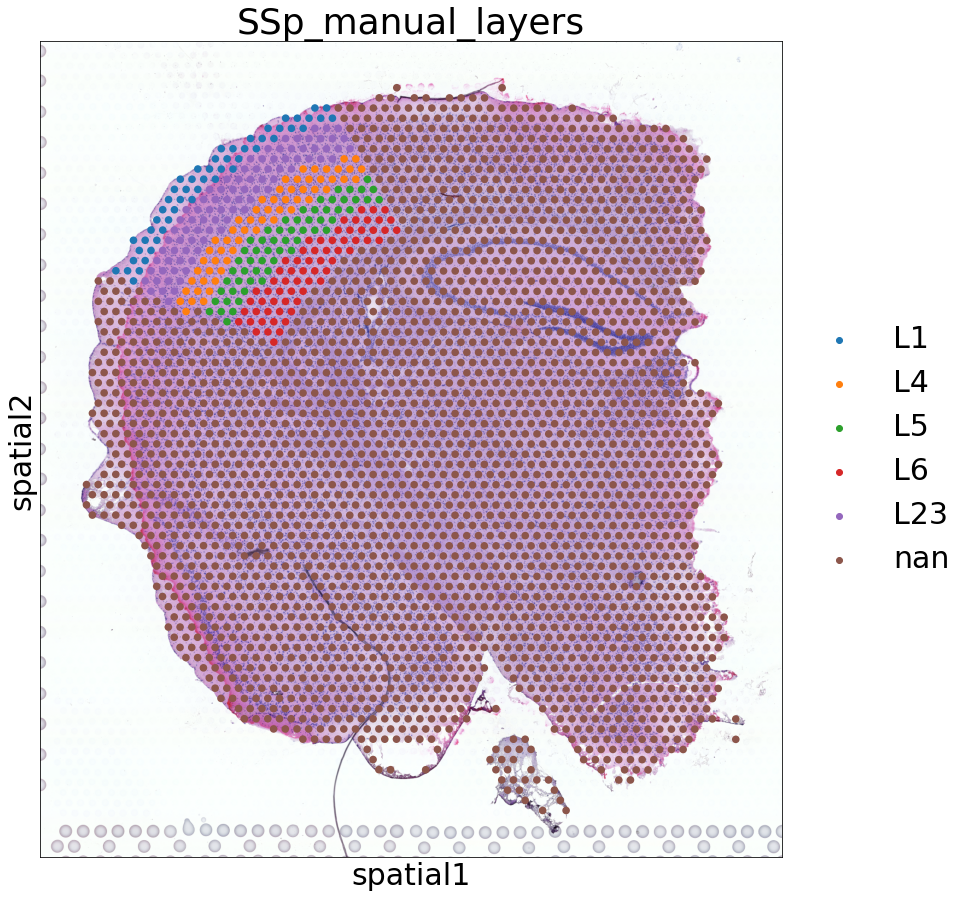

In [9]:
with mpl.rc_context({'axes.facecolor':  'white', 'figure.figsize': [15, 15], 'font.size': 30}):
    sc.pl.spatial(slides['ST8059048'], img_key = "hires", cmap='magma',
                  color=['SSp_manual_layers'], size=1,
                  gene_symbols='SYMBOL', ncols=1,
                  save='Fig2I_layers_zoom.pdf')

Now let's look at QC: total number of counts and total number of genes per spot

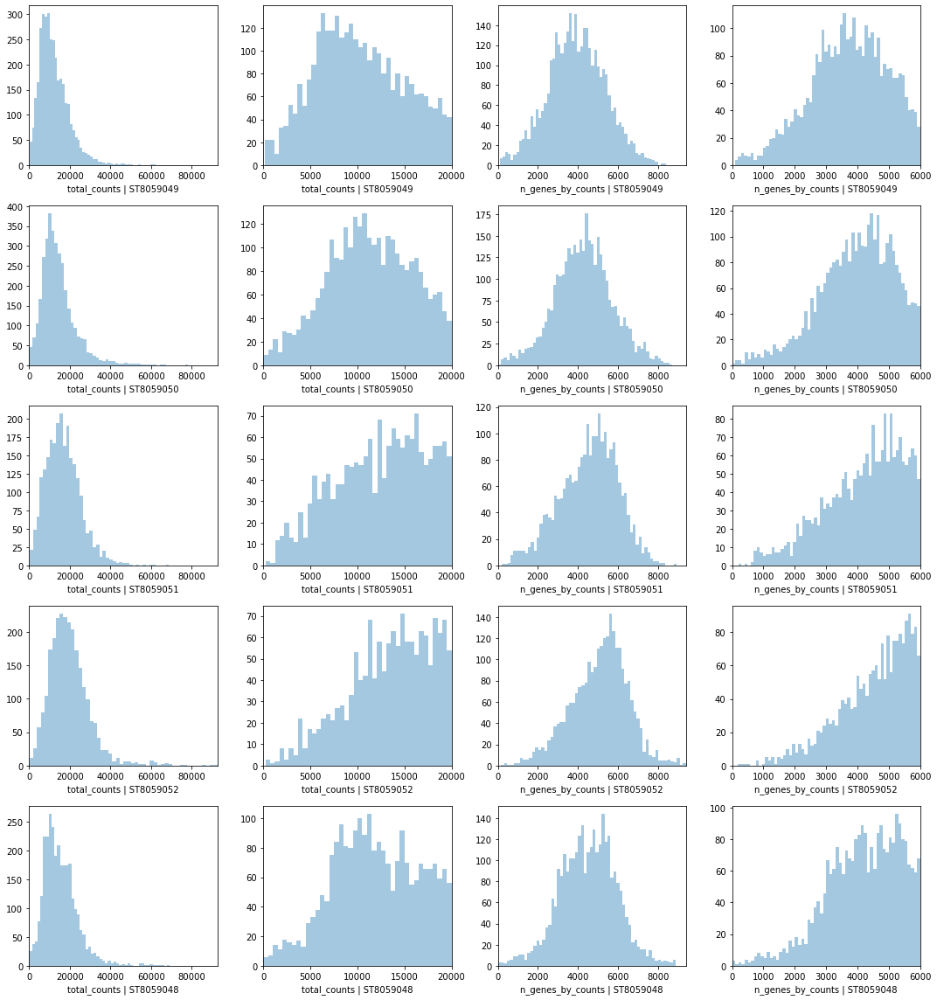

In [10]:
# PLOT QC FOR EACH SAMPLE 
fig, axs = plt.subplots(len(slides), 4, figsize=(15, 4*len(slides)-4))
for i in range(len(slides)):
    #fig.suptitle('Covariates for filtering')
    
    sns.distplot(list(slides.values())[i].obs['total_counts'], 
                 kde=False, ax = axs[i, 0])
    axs[i, 0].set_xlim(0, adata.obs['total_counts'].max())
    axs[i, 0].set_xlabel('total_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['total_counts']\
                 [list(slides.values())[i].obs['total_counts']<20000],
                 kde=False, bins=40, ax = axs[i, 1])
    axs[i, 1].set_xlim(0, 20000)
    axs[i, 1].set_xlabel('total_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['n_genes_by_counts'],
                 kde=False, bins=60, ax = axs[i, 2])
    axs[i, 2].set_xlim(0, adata.obs['n_genes_by_counts'].max())
    axs[i, 2].set_xlabel('n_genes_by_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['n_genes_by_counts']\
                 [list(slides.values())[i].obs['n_genes_by_counts']<6000],
                 kde=False, bins=60, ax = axs[i, 3])
    axs[i, 3].set_xlim(0, 6000)
    axs[i, 3].set_xlabel('n_genes_by_counts | ' + list(slides.keys())[i])
    
plt.tight_layout()

## Loading Allen single cell reference data <a class="anchor" id="read_allen"></a>

Download count matrices: 

```bash
cd /nfs/team205/vk7/sanger_projects/large_data/mouse_zeisel && wget https://storage.googleapis.com/linnarsson-lab-loom/l5_all.loom
```

```python
adata_snrna_raw = sc.read_loom(sc_data_folder + 'l5_all.loom')

# rename row names to ENSEMBL
adata_snrna_raw.var['SYMBOL'] = adata_snrna_raw.var_names
adata_snrna_raw.var_names = adata_snrna_raw.var['Accession']
adata_snrna_raw.var_names.name = None

# add readable name for low-level cluster
adata_snrna_raw.obs['Class_ClusterName'] = adata_snrna_raw.obs['Class'] + adata_snrna_raw.obs['ClusterName']

adata_snrna_raw.write(sc_data_folder + 'l5_all.h5ad')
```

```python
adata_snrna_raw = sc.read_h5ad(sc_data_folder + 'l5_all.h5ad')

# cells present in our sections
matching_labels = {'cortex': ['SScortex', 'Ctx1', 'Ctx2', 'Ctx3'],
                   'hippocampus': ['CA1', 'DentGyr'],
                   'thalamus': ['Thal'],
                   'hypothalamus': ['Hypoth'],
                   'amygdala': ['Amygd'],
                   'striatum': ['StriatVent', 'StriatDor'],
                   'negative': ['Medulla', 'Pons', 'DRG', 'ENS', 'Sympath']}

matching_labels = {k: [str(i) for i in v] for k,v in matching_labels.items()}

# add broad annotations to adata and save as csv
adata_snrna_raw.obs['matching_region'] = np.zeros(adata_snrna_raw.n_obs).astype(str)
for k, v in matching_labels.items():
    adata_snrna_raw.obs['matching_region'][adata_snrna_raw.obs['Tissue'].isin(v)] = k

# add readable name for low-level cluster
adata_snrna_raw.obs['Class_ClusterName'] = adata_snrna_raw.obs['Class'].astype(str) \
+ pd.Series('_', index=adata_snrna_raw.obs_names) + adata_snrna_raw.obs['ClusterName'].astype(str)

# remove cells with duplicated names
adata_snrna_raw = adata_snrna_raw[~adata_snrna_raw.obs_names.duplicated(), :]

matching_ind = adata_snrna_raw.obs['matching_region'] != '0.0'
adata_snrna_raw[matching_ind,:].write(sc_data_folder + 'matching_region_visium.h5ad')
```

In [11]:
adata_snrna_raw = sc.read_h5ad(sc_data_folder + 'matching_region_visium.h5ad')

In [12]:
adata_snrna_raw.obs['matching_region'].value_counts()

negative        30617
cortex          23094
striatum        12105
thalamus        10319
hippocampus      9881
hypothalamus     5480
amygdala         3994
Name: matching_region, dtype: int64

In [13]:
adata_snrna_raw.obs['SampleID'].value_counts().tail(20)

10X49_2    331
10X46_3    310
10X56_2    285
10X35_3    282
10X46_2    274
10X50_1    250
10X06_1    242
10X06_2    207
10X06_3    206
10X56_3    203
10X34_2    202
10X35_4    186
10X34_1    155
10X54_6    145
10X11_1     89
10X86_1     17
10X87_1      5
10X86_3      3
10X87_4      3
10X87_2      2
Name: SampleID, dtype: int64

In [14]:
adata_snrna_raw.obs['SampleID'].value_counts()

10X26_3    3732
10X26_4    3196
10X81_3    3036
10X81_1    2899
10X81_2    2853
           ... 
10X86_1      17
10X87_1       5
10X86_3       3
10X87_4       3
10X87_2       2
Name: SampleID, Length: 94, dtype: int64

In [15]:
# remove samples represented by too few cells
adata_snrna_raw = adata_snrna_raw[~adata_snrna_raw.obs['SampleID'].isin(adata_snrna_raw.obs['SampleID'].value_counts().tail(6).index), :]

In [16]:
adata_snrna_raw.obs['Class'].value_counts()

Neurons           46540
Oligos            17032
PeripheralGlia    11208
Astrocytes         9720
Vascular           5677
Immune             4143
Ependymal          1051
Name: Class, dtype: int64

In [17]:
adata_snrna_raw.obs['ClusterName'].value_counts().tail(31)

PSPEP8    28
HBSER3    27
HBINH7    25
HBNOR     23
HBCHO2    22
HBINH2    22
EPMB      15
HYPEP8    15
SYCHO1    15
ENT1      14
HBCHO4    14
ACOB      14
CBINH1    13
HBINH1    13
HYPEN     13
HYPEP7    13
CBGRC     12
DEINH6    12
HBGLU8    11
HBINH8    11
HBCHO1    10
HBGLU4     7
DETPH      7
HBSER1     6
CBNBL2     5
ACBG       5
MBDOP2     5
EPSC       4
OBNBL5     2
CBINH2     1
OBNBL4     1
Name: ClusterName, dtype: int64

In [18]:
# remove samples represented by too few cells
adata_snrna_raw = adata_snrna_raw[~adata_snrna_raw.obs['ClusterName'].isin(adata_snrna_raw.obs['ClusterName'].value_counts().tail(31).index), :]

In [19]:
adata_snrna_raw.obs['Tissue'].value_counts()

ENS           11618
Thal          10305
Ctx3           8981
Medulla        8295
StriatVent     7508
Ctx1           7323
Pons           7184
CA1            5605
Hypoth         5394
StriatDor      4592
Ctx2           4521
DentGyr        4260
Amygd          3981
DRG            2279
SScortex       2263
Sympath         877
Name: Tissue, dtype: int64

In [20]:
adata_snrna_raw.obs['Region'].value_counts()

CNS                                                                                26803
Cortex                                                                             14139
Enteric nervous system                                                             11618
Hippocampus,Cortex                                                                  6068
Telencephalon                                                                       5053
Hypothalamus,Thalamus,Midbrain dorsal,Midbrain ventral,Pons,Medulla,Spinal cord     3915
Striatum ventral                                                                    3723
Dentate gyrus                                                                       3504
Thalamus                                                                            2968
Hypothalamus                                                                        1990
Striatum dorsal                                                                     1963
Dorsal root ganglion 

In [21]:
# checking that data is integer counts
adata_snrna_raw.X.data

array([21.,  1., 14., ...,  3.,  1.,  3.], dtype=float32)

## 2. Reduce the number of genes by discarding lowly expressed genes <a name="2.-Reduce-the-number-of-genes-by-discarding-lowly-expressed-genes"></a>

This is performed using 2 cut-off to remove as many lowly expressed genes as possible and yet avoid highly variable gene selection (HVG) which is prone to deleting markers of rare populations:

1. Include all genes expressed by at least 3% of cells (`cell_count_cutoff2`)
2. Include genes expressed by at least 0.02% of cells (`cell_count_cutoff`) when they have high counts in non-zero cells (`nonz_mean_cutoff`)

We prefer this way of selecting genes because step 2 allows retaining genes expressed by rare cell populations but at high levels, whereas standard HVG selection methods can filter out such genes due to their low global mean and variance.

Trying to set attribute `.obs` of view, copying.


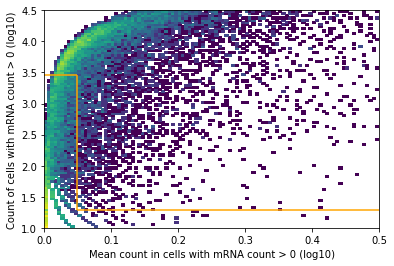

In [22]:
# remove cells and genes with 0 counts everywhere
sc.pp.filter_cells(adata_snrna_raw, min_genes=1)
sc.pp.filter_genes(adata_snrna_raw, min_cells=1)

# calculate the mean of each gene across non-zero cells
adata_snrna_raw.var['n_cells'] = np.array((adata_snrna_raw.X > 0).sum(0)).flatten()
adata_snrna_raw.var['nonz_mean'] = np.array(adata_snrna_raw.X.toarray().sum(0)).flatten() \
/ adata_snrna_raw.var['n_cells']

plt.hist2d(np.log10(adata_snrna_raw.var['nonz_mean']),
           np.log10(adata_snrna_raw.var['n_cells']), bins=100,
           norm=mpl.colors.LogNorm(),
           range=[[0,0.5], [1,4.5]]);

nonz_mean_cutoff = np.log10(1.12) # cut off for expression in non-zero cells 
cell_count_cutoff = np.log10(adata_snrna_raw.shape[0] * 0.0002) # cut off percentage for cells with higher expression
cell_count_cutoff2 = np.log10(adata_snrna_raw.shape[0] * 0.03)# cut off percentage for cells with small expression

plt.vlines(nonz_mean_cutoff, cell_count_cutoff, cell_count_cutoff2, color = 'orange');
plt.hlines(cell_count_cutoff, nonz_mean_cutoff, 1, color = 'orange');
plt.hlines(cell_count_cutoff2, 0, nonz_mean_cutoff, color = 'orange');
plt.xlabel('Mean count in cells with mRNA count > 0 (log10)');
plt.ylabel('Count of cells with mRNA count > 0 (log10)');

Show the number of selected cells and genes:

In [23]:
adata_snrna_raw[:,(np.array(np.log10(adata_snrna_raw.var['nonz_mean']) > nonz_mean_cutoff)
         | np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff2))
      & np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff)].shape

(94986, 12620)

Filter the object:

In [24]:
# select genes based on mean expression in non-zero cells
adata_snrna_raw = adata_snrna_raw[:,(np.array(np.log10(adata_snrna_raw.var['nonz_mean']) > nonz_mean_cutoff)
         | np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff2))
      & np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff)]

Add counts matrix as `adata.raw`

In [25]:
adata_snrna_raw.raw = adata_snrna_raw

In [26]:
adata_snrna_raw.obsm['X_umap'] = adata_snrna_raw.obs[['_X', '_Y']].values

In [27]:
f'{results_folder}plots/figures/'

'/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/zeisel/plots/figures/'

## 3. Show UMAP of cells <a name="3.-Show-UMAP-of-cells"></a>

We can examine the cell composition of our data by using a standard scanpy workflow to generate a UMAP representation of the single cell data.

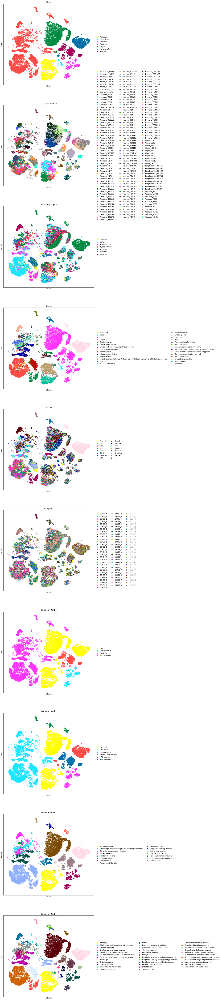

In [28]:
with mpl.rc_context({'figure.figsize': [10, 10],
                     'axes.facecolor': 'white'}):

    fig_path = f'{results_folder}plots/figures/'
    sc_figpath = sc.settings.figdir
    sc.settings.figdir = f'{fig_path}'
    
    sc.pl.umap(adata_snrna_raw, color=['Class', 'Class_ClusterName', 'matching_region',
                                       'Region', 'Tissue', 'SampleID',
                                       'TaxonomyRank1', 'TaxonomyRank2', 'TaxonomyRank3', 'TaxonomyRank4'], 
               size=15,
               #color_map = 'RdPu', 
               ncols = 1, #legend_loc='on data',
               legend_fontsize=10, palette=sc.pl.palettes.default_102,
               save=f'paper_dimred.pdf')

In [ ]:
#########################
adata_snrna_raw.X = adata_snrna_raw.raw.X.copy()
#del adata_snrna_raw.uns['log1p']
sc.pp.log1p(adata_snrna_raw)

sc.pp.scale(adata_snrna_raw, max_value=10)
sc.tl.pca(adata_snrna_raw, svd_solver='arpack', n_comps=80, use_highly_variable=False)

# Plot total counts over PC to check whether PC is indeed associated with total counts
#sc.pl.pca_variance_ratio(adata_snrna_raw, log=True)
sc.pl.pca(adata_snrna_raw, color=['_Total'],
          components=['0,1', '2,3', '4,5', '6,7', '8,9', '10,11', '12,13'],
          color_map = 'RdPu', ncols = 3, legend_loc='on data', vmax='p99.5',
          legend_fontsize=10, gene_symbols='SYMBOL')

# remove the first PC which explains large amount of variance in total UMI count (likely technical variation)
adata_snrna_raw.obsm['X_pca'] = adata_snrna_raw.obsm['X_pca'][:, 1:]
adata_snrna_raw.varm['PCs'] = adata_snrna_raw.varm['PCs'][:, 1:]
#########################

# Here BBKNN (https://github.com/Teichlab/bbknn) is used to align batches (10X experiments) 
import bbknn
bbknn.bbknn(adata_snrna_raw, neighbors_within_batch = 2, batch_key = 'SampleID', n_pcs = 79)
sc.tl.umap(adata_snrna_raw, min_dist = 0.3, spread = 1.5)

#########################

adata_snrna_raw = adata_snrna_raw[adata_snrna_raw.obs['Class_ClusterName'].argsort(),:]

In [ ]:
with mpl.rc_context({'figure.figsize': [10, 10],
                     'axes.facecolor': 'white'}):
    
    fig_path = f'{results_folder}plots/figures/'
    sc_figpath = sc.settings.figdir
    sc.settings.figdir = f'{fig_path}'
    
    sc.pl.umap(adata_snrna_raw, color=['Class', 'Class_ClusterName', 'matching_region',
                                       'Region', 'Tissue', 'SampleID',
                                       'TaxonomyRank1', 'TaxonomyRank2', 'TaxonomyRank3', 'TaxonomyRank4'], 
               size=15,
               #color_map = 'RdPu', 
               ncols = 1, #legend_loc='on data',
               legend_fontsize=10, palette=sc.pl.palettes.default_102,
               save=f'bbknn_dimred.pdf')

In [29]:
fig_path

'/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/zeisel/plots/figures/'

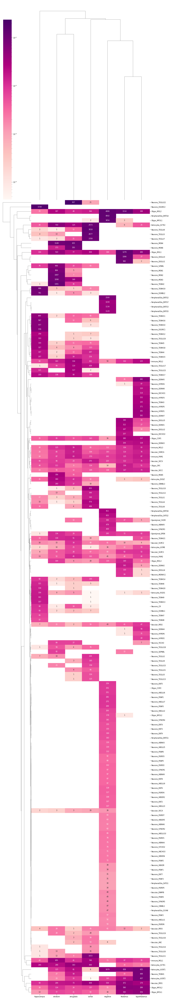

In [30]:
# check which clusters are in which section
def count_cells(adata, sample, cluster):
    
    return (adata.obs['matching_region'].isin([sample]) & adata.obs['Class_ClusterName'].isin([cluster])).sum()
    
count_mat = [[count_cells(adata_snrna_raw, i, j) 
              for i in adata_snrna_raw.obs['matching_region'].unique()]
             for j in adata_snrna_raw.obs['Class_ClusterName'].unique()]
count_df = pd.DataFrame(count_mat, index=adata_snrna_raw.obs['Class_ClusterName'].unique(), 
                        columns=adata_snrna_raw.obs['matching_region'].unique())
#count_fraq_df = (count_df.T / count_df.sum(1)).T
count_fraq_df = count_df / count_df.sum(0)
count_df = count_df.astype(int)

#mpl.rc_file_defaults()
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text

with mpl.rc_context({'axes.facecolor': 'white', 'font.size': 8}):
    fig = sns.clustermap(count_fraq_df, figsize=[12, 70], cmap='RdPu', 
                   norm=mpl.colors.LogNorm(),
                   row_cluster=True, annot_kws={'rotation': 0},
                   annot=count_df.astype(int), fmt='d')
    plt.savefig(f"{fig_path}cell_types_per_matching_region.pdf", bbox_inches='tight')

Useful columns:

- 'Class' - broad class
- 'ClusterName' - low level cluster name
- 'Class_ClusterName' - combined readable low-level name
- 'Region' - regions where cells come from
- 'Tissue' - alternative naming of regions (where samples where dissected?)
- 'SampleID' - 10X sample ID
- ['TaxonomyRank1', 'TaxonomyRank2', 'TaxonomyRank3', 'TaxonomyRank4', 'ClusterName'] - hierarchy of cell types from top to bottom

In [ ]:
# Run the pipeline:
from cell2location import run_regression
r, adata_snrna_raw = run_regression(adata_snrna_raw, # input data object]
                   
                   verbose=True, return_all=True,
                                 
                   train_args={
                    'covariate_col_names': ['Class_ClusterName'], # column listing cell type annotation
                    'sample_name_col': 'SampleID', # column listing sample ID for each cell
                    
                    # column listing technology, e.g. 3' vs 5', 
                    # when integrating multiple single cell technologies corresponding 
                    # model is automatically selected
                    'tech_name_col': None, 
                    
                    'stratify_cv': 'Class_ClusterName', # stratify cross-validation by cell type annotation
                       
                    'n_epochs': 30, 'minibatch_size': 1024, 'learning_rate': 0.01, 'n_restarts': 2,
                       
                    'use_cuda': True, # use GPU?
                       
                    'train_proportion': 0.9, # proportion of cells in the training set (for cross-validation)
                    'l2_weight': True,  # uses defaults for the model
                    
                    'readable_var_name_col': 'SYMBOL', 'use_raw': True},
                                 
                   model_kwargs={}, # keep defaults
                   posterior_args={}, # keep defaults
                                 
                   export_args={'path': results_folder + 'regression_model/', # where to save results
                                'save_model': True, # save pytorch model?
                                'run_name_suffix': ''})

reg_mod = r['mod']

In [ ]:
# Run the pipeline:
from cell2location import run_regression
r, adata_snrna_raw = run_regression(adata_snrna_raw, # input data object]
                   
                   verbose=True, return_all=True,
                                 
                   train_args={
                    'covariate_col_names': ['Class_ClusterName'], # column listing cell type annotation
                    'sample_name_col': 'SampleID', # column listing sample ID for each cell
                    
                    # column listing technology, e.g. 3' vs 5', 
                    # when integrating multiple single cell technologies corresponding 
                    # model is automatically selected
                    'tech_name_col': None, 
                    
                    'stratify_cv': 'Class_ClusterName', # stratify cross-validation by cell type annotation
                       
                    'n_epochs': 30, 'minibatch_size': 1024, 'learning_rate': 0.01, 'n_restarts': 2,
                       
                    'use_cuda': True, # use GPU?
                       
                    'train_proportion': 0.9, # proportion of cells in the training set (for cross-validation)
                    'l2_weight': {'l2_weight': 0.001, 'sample_scaling_weight': 0.5,
                           'gene_overdisp_weight': 0.1},  # uses defaults for the model
                    
                    'readable_var_name_col': 'SYMBOL', 'use_raw': True},
                                 
                   model_kwargs={}, # keep defaults
                   posterior_args={}, # keep defaults
                                 
                   export_args={'path': results_folder + 'regression_model/', # where to save results
                                'save_model': True, # save pytorch model?
                                'run_name_suffix': 'alpha_l2_01'})

reg_mod = r['mod']

In [ ]:
# Run the pipeline:
from cell2location import run_regression
r, adata_snrna_raw = run_regression(adata_snrna_raw, # input data object]
                   
                   verbose=True, return_all=True,
                                 
                   train_args={
                    'covariate_col_names': ['Class_ClusterName'], # column listing cell type annotation
                    'sample_name_col': 'SampleID', # column listing sample ID for each cell
                    
                    # column listing technology, e.g. 3' vs 5', 
                    # when integrating multiple single cell technologies corresponding 
                    # model is automatically selected
                    'tech_name_col': None, 
                    
                    'stratify_cv': 'Class_ClusterName', # stratify cross-validation by cell type annotation
                       
                    'n_epochs': 50, 'minibatch_size': 1024, 'learning_rate': 0.01, 'n_restarts': 2,
                       
                    'use_cuda': True, # use GPU?
                       
                    'train_proportion': 0.7, # proportion of cells in the training set (for cross-validation)
                    'l2_weight': {'l2_weight': 0.001, 'sample_scaling_weight': 0.5,
                           'gene_overdisp_weight': 0.1},  # uses defaults for the model
                    
                    'readable_var_name_col': 'SYMBOL', 'use_raw': True},
                                 
                   model_kwargs={}, # keep defaults
                   posterior_args={}, # keep defaults
                                 
                   export_args={'path': results_folder + 'regression_model/', # where to save results
                                'save_model': True, # save pytorch model?
                                'run_name_suffix': 'alpha_l2_01_train_p07'})

reg_mod = r['mod']

In [31]:
results_folder + 'regression_model/'

'/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/zeisel/regression_model/'

In [32]:
## snRNAseq reference (raw counts)
regression_model_output = 'RegressionGeneBackgroundCoverageTorch_263covariates_94986cells_12620genes'
reg_path = f'{results_folder}regression_model/{regression_model_output}/'
adata_snrna_raw = sc.read(f'{reg_path}sc.h5ad')

## model
r = pickle.load(file = open(f'{reg_path}model_.p', "rb"))
reg_mod = r['mod']

In [33]:
# Column name containing cell type annotations
covariate_col_names = 'Class_ClusterName'

# Extract a pd.DataFrame with signatures from anndata object
inf_aver = adata_snrna_raw.raw.var.copy()
inf_aver = inf_aver.loc[:, [f'means_cov_effect_{covariate_col_names}_{i}' for i in adata_snrna_raw.obs[covariate_col_names].unique()]]
from re import sub
inf_aver.columns = [sub(f'means_cov_effect_{covariate_col_names}_{i}', '', i) for i in adata_snrna_raw.obs[covariate_col_names].unique()]
inf_aver = inf_aver.iloc[:, inf_aver.columns.argsort()]

# normalise by average experiment scaling factor (corrects for sequencing depth)
inf_aver = inf_aver * adata_snrna_raw.uns['regression_mod']['post_sample_means']['sample_scaling'].mean()

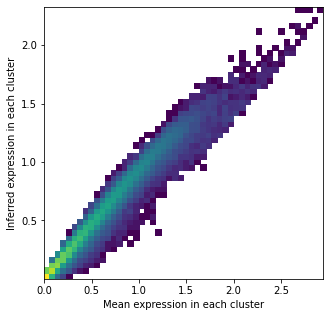

In [34]:
# compute mean expression of each gene in each cluster
aver = cell2location.cluster_averages.cluster_averages.get_cluster_averages(adata_snrna_raw, covariate_col_names)
aver = aver.loc[adata_snrna_raw.var_names, inf_aver.columns]

# compare estimated signatures (y-axis) to analytically computed mean expression (x-axis)
with mpl.rc_context({'figure.figsize': [5, 5]}):
    plt.hist2d(np.log10(aver.values.flatten()+1), np.log10(inf_aver.values.flatten()+1),
               bins=50, norm=mpl.colors.LogNorm());
    plt.xlabel('Mean expression in each cluster');
    plt.ylabel('Inferred expression in each cluster');

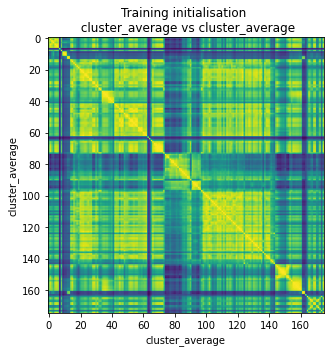

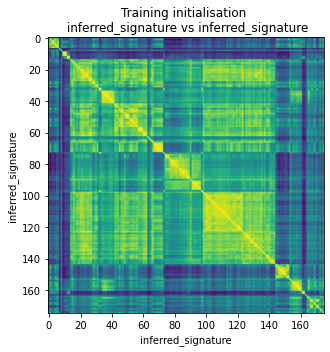

In [35]:
# Look at how correlated are the signatures obtained by computing mean expression
with mpl.rc_context({'figure.figsize': [5, 5]}):
    reg_mod.align_plot_stability(aver, aver, 'cluster_average', 'cluster_average', align=False)
    plt.show()

# Look at how correlated are the signatures inferred by regression model - they should be less correlated than above
with mpl.rc_context({'figure.figsize': [5, 5]}):
    reg_mod.align_plot_stability(inf_aver, inf_aver, 'inferred_signature', 'inferred_signature', align=False)
    plt.show()

In [36]:
adata_vis = adata.copy()
adata_vis.raw = adata_vis

## cell2location analysis  <a class="anchor" id="cell2location"></a>

Here we show how to perform the first step in one function run - train cell2location model to learn cell locations. Results are shown below and saved to:  

In [36]:
r = cell2location.run_cell2location(
                      sc_data=inf_aver, 
                      sp_data=adata_vis,
    
                      verbose=True, return_all=False,
                      
                      summ_sc_data_args={'cluster_col': "Class_ClusterName"},
                                      
                      train_args={'use_raw': True,
                                  'n_iter': 30000, 'learning_rate': 0.005,
                                  'sample_prior': False, # set to false for large spatial data 
                                  'readable_var_name_col': "SYMBOL",
                                  'sample_name_col': 'sample'},
                                      
                      posterior_args={'n_samples': 1000},
                                      
                      export_args={'path': results_folder, 
                                   'run_name_suffix': '_matching_regions_30k',
                                   'save_model': False,
                                   'scanpy_coords_name': 'spatial', 'export_q05': True},
    
                      model_kwargs={ # Prior on the number of cells, cell types and co-located combinations
          
                    'cell_number_prior': {
                        # Use visual inspection of the tissue image to determine 
                        # the average number of cells per spot,
                        # an approximate count is good enough:
                        'cells_per_spot': 8, 
                        # Prior on the number of cell types (or factors) in each spot
                        'factors_per_spot': 7, 
                        # Prior on the number of correlated cell type combinations in each spot
                        'combs_per_spot': 6
                    },
          
                     # Prior on change in sensitivity between technologies
                    'gene_level_prior':{
                        # Prior on average change in expression level from scRNA-seq to spatial technology,
                        # this reflects your belief about the sensitivity of the technology in you experiment
                        'mean': 1/2, 
                        # Prior on how much individual genes differ from that average,
                        # a good choice of this value should be lower that the mean
                        'sd': 1/4
                    },
                          
                     # The number of co-located cell type combinations
                    'n_comb': 50, 'spot_fact_mean_var_ratio': 5
      }
)

### Summarising single cell clusters ###
### Creating model ### - time 0.08 min
### Analysis name: LocationModelLinearDependentWMultiExperiment_5experiments_175clusters_14968locations_12570genes_matching_regions_30k
### Training model ###


Finished [100%]: Average Loss = 1.5372e+08


Finished [100%]: Average Loss = 1.537e+08



### Sampling posterior ### - time 143.41 min



### Saving results ###


... storing 'sample' as categorical
... storing 'sample_name' as categorical
... storing 'sample_name2' as categorical
... storing 'image_name' as categorical
... storing 'slide' as categorical
... storing 'position' as categorical
... storing 'SSp_manual_layers' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


### Ploting results ###
### Plotting posterior of W / cell locations ###
### Done ### - time 209.9 min


In [37]:
r = cell2location.run_cell2location(
                      sc_data=adata_snrna_raw, 
                      sp_data=adata_vis,
    
                      verbose=True, return_all=False,
                      
                      summ_sc_data_args={'cluster_col': "Class_ClusterName"},
                                      
                      train_args={'use_raw': True,
                                  'n_iter': 30000, 'learning_rate': 0.005,
                                  'sample_prior': False, # set to false for large spatial data 
                                  'readable_var_name_col': "SYMBOL",
                                  'sample_name_col': 'sample'},
                                      
                      posterior_args={'n_samples': 1000},
                                      
                      export_args={'path': results_folder, 
                                   'run_name_suffix': '_averages_matching_regions_30k',
                                   'save_model': False,
                                   'scanpy_coords_name': 'spatial', 'export_q05': True},
    
                      model_kwargs={ # Prior on the number of cells, cell types and co-located combinations
          
                    'cell_number_prior': {
                        # Use visual inspection of the tissue image to determine 
                        # the average number of cells per spot,
                        # an approximate count is good enough:
                        'cells_per_spot': 8, 
                        # Prior on the number of cell types (or factors) in each spot
                        'factors_per_spot': 7, 
                        # Prior on the number of correlated cell type combinations in each spot
                        'combs_per_spot': 6
                    },
          
                     # Prior on change in sensitivity between technologies
                    'gene_level_prior':{
                        # Prior on average change in expression level from scRNA-seq to spatial technology,
                        # this reflects your belief about the sensitivity of the technology in you experiment
                        'mean': 1/2, 
                        # Prior on how much individual genes differ from that average,
                        # a good choice of this value should be lower that the mean
                        'sd': 1/4
                    },
                          
                     # The number of co-located cell type combinations
                    'n_comb': 50, 'spot_fact_mean_var_ratio': 5
      }
)

### Summarising single cell clusters ###
### Creating model ### - time 0.11 min
### Analysis name: LocationModelLinearDependentWMultiExperiment_5experiments_175clusters_14968locations_12570genes_averages_matching_regions_30k
### Training model ###


Finished [100%]: Average Loss = 1.5378e+08


Finished [100%]: Average Loss = 1.5375e+08



### Sampling posterior ### - time 145.33 min



### Saving results ###


... storing 'sample' as categorical
... storing 'sample_name' as categorical
... storing 'sample_name2' as categorical
... storing 'image_name' as categorical
... storing 'slide' as categorical
... storing 'position' as categorical
... storing 'SSp_manual_layers' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


### Ploting results ###
### Plotting posterior of W / cell locations ###
### Done ### - time 219.09 min


Trained model object can be pulled from `r['mod']`, cell locations are added to `r['sp_data']` as columns of `sp_data.obs` and all paramters of the model are exported to `sp_data.uns['mod']`. This anndata object and a csv file `W.csv` / `W_q05.csv` with cell locations are always saved to the results directory. 

When `'save_model': True`, the trained model `r['mod']` is also saved as a pickle file. You can load the model later and continue training. 

Now we need to check if our model has trained successfully by looking at the loss / cost function over training iterations. This plot omits the first 20% of training iterations during which loss changes by orders of magnitude.

#### Evaluating training

In [38]:
run = {'run_name': 'LocationModelLinearDependentWMultiExperiment_5experiments_175clusters_14968locations_12570genes_averages_matching_regions_30k'}

# path for saving figures
fig_path = f'{results_folder}{run["run_name"]}/plots/figures/'
sc_figpath = sc.settings.figdir
sc.settings.figdir = f'{fig_path}'

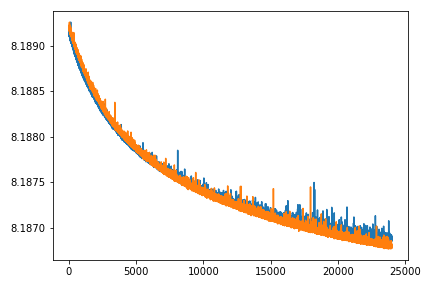

In [39]:
from IPython.display import Image
Image(filename=results_folder+run['run_name']+'/plots/training_history_without_first_20perc.png',
      width=400)

We also need to evaluate the reconstruction accuracy or how well cell types and uniform background explain spatial data bu comparing expected value of the model (Poisson mean) to observed count of each gene across locations. The ideal case is perfect diagonal plot.

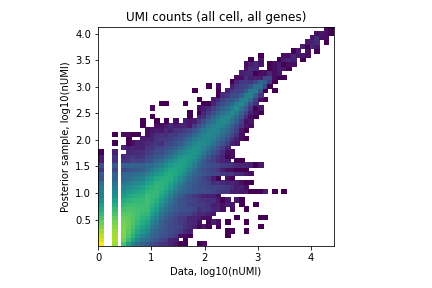

In [40]:
Image(filename=results_folder +run['run_name']+'/plots/data_vs_posterior_mean.png',
      width=400)

Finally, we need to evaluate robustness of the identified locations by comparing consistency of inferred locations between two independent training restarts.

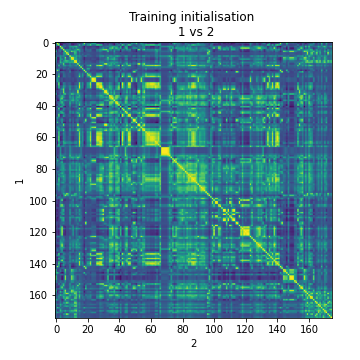

In [41]:
Image(filename=results_folder +run['run_name']+'/plots/evaluate_stability.png',
      width=400)

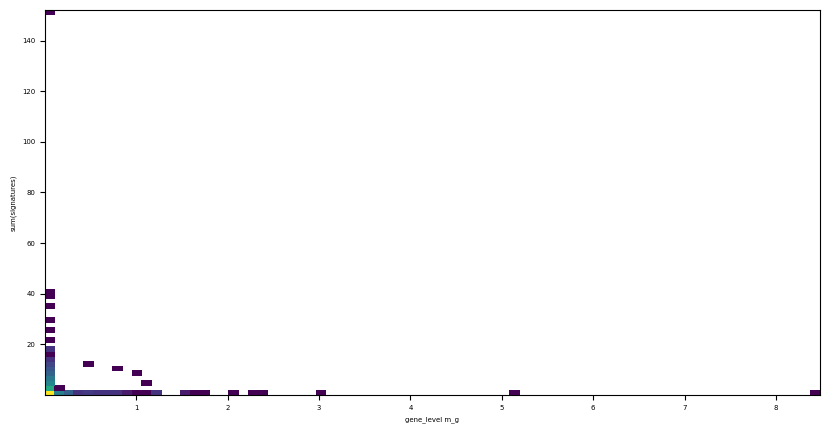

0.02713757893687042

In [87]:
plt.hist2d(adata_vis.uns['mod']['post_sample_q05']['gene_level'].flatten(),
           adata_vis.uns['mod']['post_sample_q05']['gene_factors'].mean(1).flatten(),
           bins=80, norm=mpl.colors.LogNorm());
plt.xlabel('gene_level m_g');
plt.ylabel('sum(signatures)');
plt.savefig(f"{results_folder}/{run['run_name']}/m_g_vs_mean_g_fg.pdf");
plt.show()

adata_vis.uns['mod']['post_sample_q05']['gene_level'].flatten().mean()

### Loading cell2location results <a class="anchor" id="cell2location_res"></a>

Alternatively we can load the results of the model saved into `sp_data`:

In [42]:
sp_data_file = results_folder +run['run_name']+'/sp.h5ad'
adata_vis = anndata.read(sp_data_file)

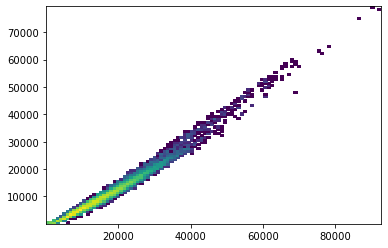

In [43]:
plt.hist2d(adata_vis.obs['total_counts'].values,
           adata_vis.uns['mod']['post_sample_q05']['nUMI_factors'].sum(1).flatten(),
           bins=100, norm=mpl.colors.LogNorm());

#### Advanced plotting of cell locations

Here we visualise locations of multiple cell types at once.

In [44]:
def select_slide(adata, s, s_col='sample'):
    r""" Select data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial samples
    :param s: name of selected sample
    :param s_col: column in adata.obs listing sample name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

## Compare cell2location to gold-standard regions

In [45]:
# read region annotations
# annotate region clusters
run_name = 'LocationModelLinearDependentWMultiExperiment_59clusters_14968locations_12809genes_n_comb50_mean_var5_inferred_30k'
region_annot = pd.read_csv(f'{vis_results_folder}{run_name}/20200904_regionAnnotation_per_location.csv',
                           index_col='spot_id')
adata_vis.obs[region_annot.columns] = region_annot.loc[adata_vis.obs_names,:]

# keep only the locations that match reference
adata_vis_matching = adata_vis[adata_vis.obs['location'].isin(count_df.columns),:]
adata_vis_matching.obs['location'].value_counts()

cortex          4951
thalamus        2623
hypothalamus    1866
hippocampus     1064
amygdala         820
striatum         561
Name: location, dtype: int64

In [46]:
count_df

,negative,thalamus,cortex,striatum,hypothalamus,amygdala,hippocampus
Neurons_ENT9,169,0,0,0,0,0,0
Neurons_ENT8,97,0,0,0,0,0,0
Neurons_ENT6,118,0,0,0,0,0,0
Neurons_ENT5,259,0,0,0,0,0,0
Neurons_ENT4,155,0,0,0,0,0,0
...,...,...,...,...,...,...,...
Neurons_PSNP3,269,0,0,0,0,0,0
Neurons_PSNP2,72,0,0,0,0,0,0
Neurons_PSNP5,88,0,0,0,0,0,0
Neurons_PSNP4,45,0,0,0,0,0,0


In [47]:
gold_standard = count_df.copy() > 10
gold_standard.index = [f'gold_standard_{i}' for i in gold_standard.index]

# remove negative category
gold_standard = gold_standard[gold_standard.columns[gold_standard.columns != 'negative']]
gold_standard = gold_standard.loc[gold_standard.sum(1) > 0,:]

for ct in gold_standard.index:
    gold_regions = gold_standard.loc[ct] > 0
    gold_regions = gold_regions.index[gold_regions]
    adata_vis_matching.obs[ct] = adata_vis_matching.obs['location'].isin(gold_regions).astype(float)
    
adata_vis_matching.obs[gold_standard.index]

Trying to set attribute `.obs` of view, copying.


,gold_standard_Oligos_MOL3,gold_standard_Oligos_MOL2,gold_standard_Oligos_MOL1,gold_standard_Oligos_MFOL2,gold_standard_Oligos_NFOL1,gold_standard_Oligos_COP1,gold_standard_Neurons_TEGLU15,gold_standard_Neurons_TEGLU16,gold_standard_Neurons_TEGLU5,gold_standard_Neurons_TEGLU4,...,gold_standard_Immune_MGL3,gold_standard_Immune_PVM2,gold_standard_Immune_PVM1,gold_standard_Astrocytes_ACTE1,gold_standard_Astrocytes_ACTE2,gold_standard_Astrocytes_ACNT1,gold_standard_Astrocytes_ACNT2,gold_standard_Astrocytes_ACMB,gold_standard_Ependymal_EPEN,gold_standard_Ependymal_CHOR
spot_id,,,,,,,,,,,,,,,,,,,,,
ST8059048_AAACAAGTATCTCCCA-1,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
ST8059048_AAACAGAGCGACTCCT-1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
ST8059048_AAACAGCTTTCAGAAG-1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
ST8059048_AAACAGGGTCTATATT-1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
ST8059048_AAACATTTCCCGGATT-1,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ST8059052_TTGTGGTAGGAGGGAT-1,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
ST8059052_TTGTGTTTCCCGAAAG-1,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
ST8059052_TTGTTAGCAAATTCGA-1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


Trying to set attribute `.uns` of view, copying.
... storing 'old_region' as categorical
... storing 'location' as categorical
... storing 'subregion' as categorical
... storing 'cortical_layer' as categorical
... storing 'region_label' as categorical
... storing 'comments' as categorical


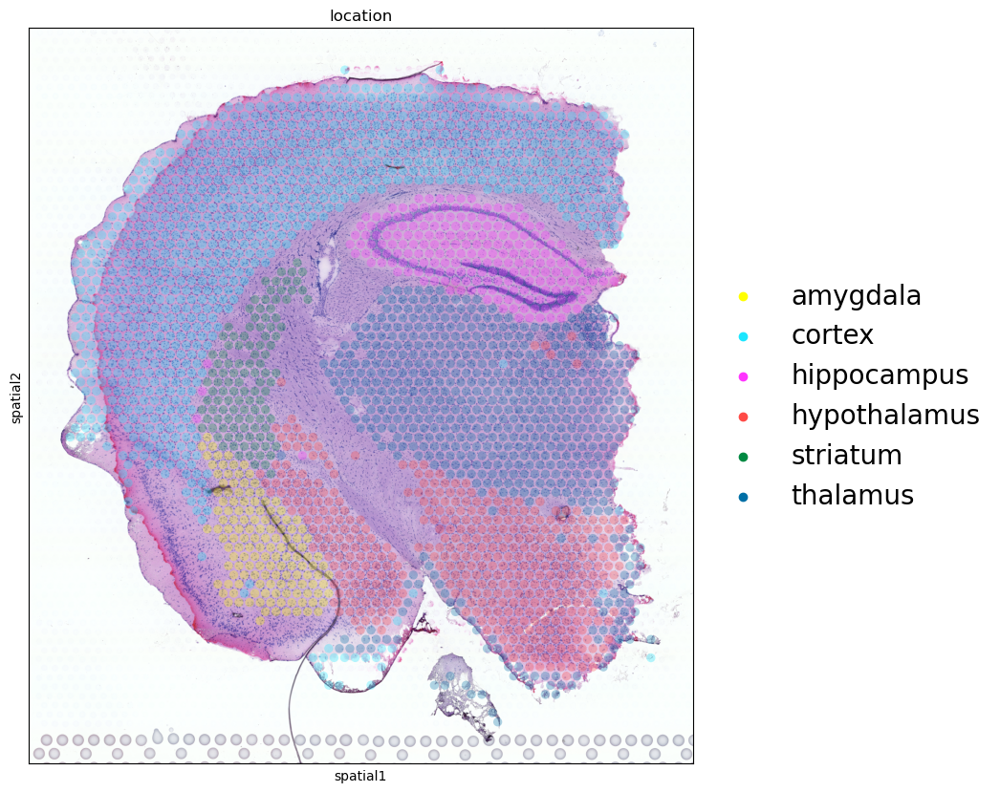

In [48]:
# identify spot locations to crop near tissue
slide = select_slide(adata_vis_matching, 'ST8059048')


mpl.rc_file_defaults()
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with mpl.rc_context({'figure.figsize': (10, 10), 'axes.facecolor': "black"}):
    sc.pl.spatial(slide, cmap='magma',
                  color=['location'], ncols=4, 
                  size=1.3, img_key='hires', 
                  alpha_img=1, alpha=0.3,
                  frameon=True, legend_fontsize=20,
                  vmin=0, vmax='p99.5', save='benchmark_supervised_location.pdf',
                  palette=sc.pl.palettes.default_102
                 )

In [49]:
import matplotlib as mpl
from matplotlib import pyplot as plt
import numpy as np
from scipy import interpolate

with plt.style.context('seaborn'):
    seaborn_colors = mpl.rcParams['axes.prop_cycle'].by_key()['color']


def compute_precision_recall(pos_cell_count, infer_cell_proportions, mode='macro'):
    r""" Plot precision-recall curves on average and for each cell type.
    :param pos_cell_count: binary matrix showing which cell types are present in which locations
    :param infer_cell_proportions: inferred locations (the higher the more cells)
    """
    
    from sklearn.metrics import precision_recall_curve
    from sklearn.metrics import average_precision_score
    
    ### calculating ###
    predictor = infer_cell_proportions.values + np.random.gamma(20, 1e-12, 
                                                                infer_cell_proportions.shape)
    # For each cell type
    precision = dict()
    recall = dict()
    average_precision = dict()
    for i, c in enumerate(infer_cell_proportions.columns):
        precision[c], recall[c], _ = precision_recall_curve(pos_cell_count[:, i],
                                                            predictor[:, i])
        average_precision[c] = average_precision_score(pos_cell_count[:, i], predictor[:, i], average=mode)

    average_precision["averaged"] = average_precision_score(pos_cell_count, predictor,
                                                     average=mode)

    # A "micro-average": quantifying score on all classes jointly
    if mode == 'micro':
        precision_, recall_, threshold = precision_recall_curve(pos_cell_count.ravel(),
                                                                        predictor.ravel())
        #precision_[threshold < 0.1] = 0
        precision["averaged"], recall["averaged"] =  precision_, recall_

    elif mode == 'macro':
        precisions = []
        recall_grid = np.linspace(0, 1, 2000)

        for i, c in enumerate(infer_cell_proportions.columns):
            f = interpolate.interp1d(recall[c], precision[c])
            precision_interp = f(recall_grid)
            precisions.append(precision_interp)

        precision["averaged"] = np.mean(precisions, axis=0)
        recall['averaged'] = recall_grid

        
    return precision, recall, average_precision

def compute_roc(pos_cell_count, infer_cell_proportions, mode='macro'):
    r""" Plot ROC curves on average and for each cell type.
    :param pos_cell_count: binary matrix showing which cell types are present in which locations
    :param infer_cell_proportions: inferred locations (the higher the more cells)
    """
    
    from sklearn.metrics import roc_curve
    from sklearn.metrics import roc_auc_score
    
    ### calculating ###
    predictor = infer_cell_proportions.values + np.random.gamma(20, 1e-12, 
                                                                infer_cell_proportions.shape)
    # For each cell type
    precision = dict()
    recall = dict()
    average_precision = dict()
    for i, c in enumerate(infer_cell_proportions.columns):
        precision[c], recall[c], _ = roc_curve(pos_cell_count[:, i],
                                                            predictor[:, i])
        average_precision[c] = roc_auc_score(pos_cell_count[:, i], predictor[:, i], average=mode)

    average_precision["averaged"] = roc_auc_score(pos_cell_count, predictor,
                                                     average=mode)

    # A "micro-average": quantifying score on all classes jointly
    if mode == 'micro':
        precision_, recall_, threshold = roc_curve(pos_cell_count.ravel(),
                                                                        predictor.ravel())
        #precision_[threshold < 0.1] = 0
        precision["averaged"], recall["averaged"] =  precision_, recall_

    elif mode == 'macro':
        precisions = []
        recall_grid = np.linspace(0, 1, 2000)

        for i, c in enumerate(infer_cell_proportions.columns):
            f = interpolate.interp1d(recall[c], precision[c])
            precision_interp = f(recall_grid)
            precisions.append(precision_interp)

        precision["averaged"] = np.mean(precisions, axis=0)
        recall['averaged'] = recall_grid

        
    return precision, recall, average_precision

def plot_precision_recall(pos_cell_count, infer_cell_proportions,
                          title='', iso_f1_curves=False,
                          individual_cell_types=True,
                          save=None, mode='macro', curve='PR'):
    r""" Plot precision-recall curves on average and for each cell type.
    :param pos_cell_count: binary matrix showing which cell types are present in which locations
    :param infer_cell_proportions: inferred locations (the higher the more cells)
    :param title: plot title
    :param iso_f1_curves: plot iso curves for F1 score?
    :param individual_cell_types: show precision-recall curves for each cell type?
    """
    
    ### calculating ###
    if curve == 'PR':
        precision, recall, average_precision = compute_precision_recall(pos_cell_count, 
                                                                        infer_cell_proportions, 
                                                                        mode=mode)
        xlabel = 'Recall'
        ylabel = 'Precision'
        
    elif curve == 'ROC':
        recall, precision, average_precision = compute_roc(pos_cell_count, 
                                                                        infer_cell_proportions, 
                                                                        mode=mode)
        xlabel = 'FPR'
        ylabel = 'TPR'
        
    ### plotting ###
    from itertools import cycle
    # setup plot details
    colors = cycle(['navy', 'turquoise', 'darkorange', 'cornflowerblue', 'teal'])

    lines = []
    labels = []
    
    if iso_f1_curves:
        f_scores = np.linspace(0.2, 0.8, num=4)
        
        for f_score in f_scores:
            x = np.linspace(0.01, 1)
            y = f_score * x / (2 * x - f_score)
            l, = plt.plot(x[y >= 0], y[y >= 0], color='gray', alpha=0.2)
            plt.annotate('f1={0:0.1f}'.format(f_score), xy=(0.9, y[45] + 0.02))

        lines.append(l)
        labels.append('iso-f1 curves')
    
    l, = plt.plot(recall["averaged"], precision["averaged"], color='navy', lw=2)
    lines.append(l)
    labels.append(f'{mode}-average {curve} ({curve} score = {round(average_precision["averaged"], 2)})')

    if individual_cell_types:
        for i, color in zip(infer_cell_proportions.columns, colors):
            l, = plt.plot(recall[i], precision[i], color='gold', lw=1)
            lines.append(l)
        labels.append(f'{curve} for individual cell types')



    fig = plt.gcf()
    fig.subplots_adjust(bottom=0.25)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(lines, labels, loc=(0, -.37), prop=dict(size=8))
    
    if save is not None:
        plt.savefig(save)

def compare_precision_recall(pos_cell_count, infer_cell_proportions,
                             method_title, title='',
                             legend_loc=(0, -.37), font_size=12, lw=3,
                             colors=sc.pl.palettes.default_102,
                             mode='macro', curve='PR'):
    
    r""" Plot precision-recall curves on average and for each cell type.
    :param pos_cell_count: binary matrix showing which cell types are present in which locations
    :param infer_cell_proportions: inferred locations (the higher the more cells), 
                                        list of inferred parameters for several methods
    :param method_title: title for each infer_cell_proportions
    :param title: plot title
    """
    # setup plot details
    from itertools import cycle
    colors = cycle(colors)
    lines = []
    labels = []
    roc = {}
    
    ### plotting ###
    for i, color in zip(range(len(infer_cell_proportions)), colors):
        
        if curve == 'PR':
            precision, recall, average_precision = compute_precision_recall(pos_cell_count, 
                                                                        infer_cell_proportions[i], 
                                                                        mode=mode)

            xlabel = 'Recall'
            ylabel = 'Precision'
            
            l, = plt.plot(recall["averaged"], precision["averaged"], color=color, lw=lw)

        elif curve == 'ROC':
            FPR, TPR, average_precision = compute_roc(pos_cell_count, 
                                                                        infer_cell_proportions[i], 
                                                                        mode=mode)

            xlabel = 'FPR'
            ylabel = 'TPR'
            
            l, = plt.plot(FPR["averaged"], TPR["averaged"], color=color, lw=lw)
            
        
        lines.append(l)

        labels.append(method_title[i] + ' (' + curve + ' score = {0:0.2f})'
                      ''.format(average_precision["averaged"]))
        roc[method_title[i]] = average_precision["averaged"]


    fig = plt.gcf()
    fig.subplots_adjust(bottom=0.25)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    if legend_loc is not None:
        plt.legend(lines, labels, loc=legend_loc, prop=dict(size=font_size))

    #plt.show()
    return roc


### Evaluating accuracy on all locations

In [50]:
from re import sub
col_ind = [sub('gold_standard_','',i) for i in gold_standard.index]

In [51]:
results_folder_st = '/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/benchmarking/zeisel_negative/'
RCTD = pd.read_csv(f'{results_folder_st}rctd/matching_regions_results_weights_121clusters_3246genes_6367genes.csv',
                   index_col='spot')
adata_vis_matching = adata_vis_matching[adata_vis_matching.obs_names.isin(RCTD.index),:]

# compute cell proportions
RCTD = (RCTD.T / RCTD.sum(1)).T
RCTD = RCTD.loc[adata_vis_matching.obs_names,:]

adata_vis_matching.obs[[f'RCTD_{i}' for i in RCTD.columns]] = RCTD.values

results = [RCTD[col_ind]]
names = ['RCTD']

Trying to set attribute `.obs` of view, copying.


In [52]:
results_folder_st = '/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/benchmarking/zeisel_negative/'
SeuratV3 = pd.read_csv(f'{results_folder_st}seurat_new/matching_regions_results_pca.csv',
                       index_col='spot')
SeuratV3 = SeuratV3.drop(columns=['prediction.score.max', 'Unnamed: 0', 'predicted.id'])
from re import sub
SeuratV3.columns = [sub('prediction.score.', '',i) for i in SeuratV3.columns]

seu_index = [sub(' ', '.',i) for i in adata_vis_matching.uns['mod']['fact_names']]
seu_index = [sub('/', '.',i) for i in seu_index]
seu_index = [sub('-', '.',i) for i in seu_index]

SeuratV3 = SeuratV3[seu_index]
SeuratV3.columns = adata_vis_matching.uns['mod']['fact_names']

# compute cell proportions
SeuratV3 = (SeuratV3.T / SeuratV3.sum(1)).T
SeuratV3[SeuratV3.isna()] = 0
SeuratV3 = SeuratV3.loc[adata_vis_matching.obs_names,:]

adata_vis_matching.obs[[f'Seurat_{i}' for i in SeuratV3.columns]] = SeuratV3.values


results = results + [SeuratV3[col_ind]]
names = names + ['Seurat']

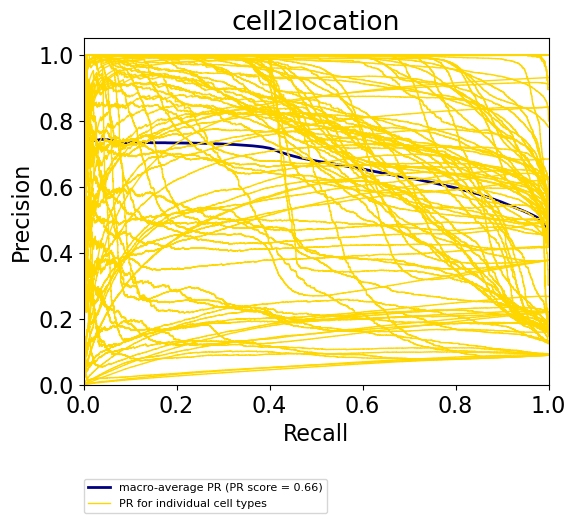

In [53]:
pos_cell_count = adata_vis_matching.obs[gold_standard.index].values
adata_vis_matching.obs[adata_vis_matching.uns['mod']['fact_names']] = adata_vis_matching.obs[[f'q05_spot_factors{i}' for i in adata_vis_matching.uns['mod']['fact_names']]]
cell2loc = adata_vis_matching.obs[adata_vis_matching.uns['mod']['fact_names']]
cell2loc = (cell2loc.T / cell2loc.sum(1)).T
cell2loc = cell2loc[col_ind]

results = [cell2loc] + results
names = ['cell2location'] + names

mpl.rc_file_defaults()
mpl.rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with mpl.rc_context({'figure.figsize': (6,5.5), 'font.size': 16}):
    plot_precision_recall(pos_cell_count, results[0], title=names[0], mode='macro')

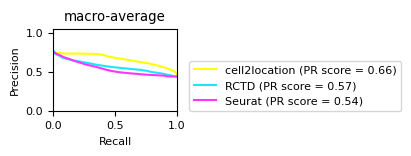

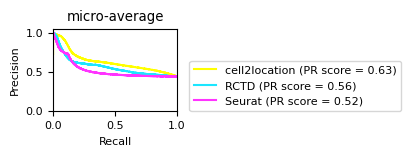

In [54]:
mpl.rc_file_defaults()
mpl.rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with mpl.rc_context({'figure.figsize': (1.6, 1.3), 'font.size': 8}):
    
    for c in ['PR']:
        for m in ['macro', 'micro']:
            compare_precision_recall(pos_cell_count, results,
                                     method_title=names, 
                                     legend_loc=(1.1, 0),
                                     mode=m, curve=c,
                                     font_size=mpl.rcParams['font.size'], lw=1.5)
                                     #colors=['navy', 'turquoise', 'darkorange', 'cornflowerblue', 'teal'])
            plt.tight_layout()
            plt.title(f'{m}-average')
            plt.savefig(f'{fig_path}/{c}_comparison_all_{m}average.pdf', bbox_inches='tight')
            plt.show()

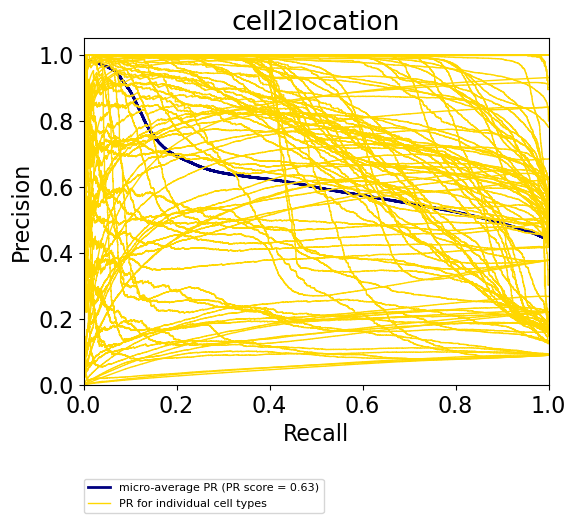

In [55]:
pos_cell_count = adata_vis_matching.obs[gold_standard.index].values
adata_vis_matching.obs[adata_vis_matching.uns['mod']['fact_names']] = adata_vis_matching.obs[[f'q05_spot_factors{i}' for i in adata_vis_matching.uns['mod']['fact_names']]]
cell2loc = adata_vis_matching.obs[adata_vis_matching.uns['mod']['fact_names']]
cell2loc = (cell2loc.T / cell2loc.sum(1)).T
cell2loc = cell2loc[col_ind]

results = [cell2loc] + results
names = ['cell2location'] + names

mpl.rc_file_defaults()
mpl.rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with mpl.rc_context({'figure.figsize': (6,5.5), 'font.size': 16}):
    plot_precision_recall(pos_cell_count, results[0], title=names[0], mode='micro')

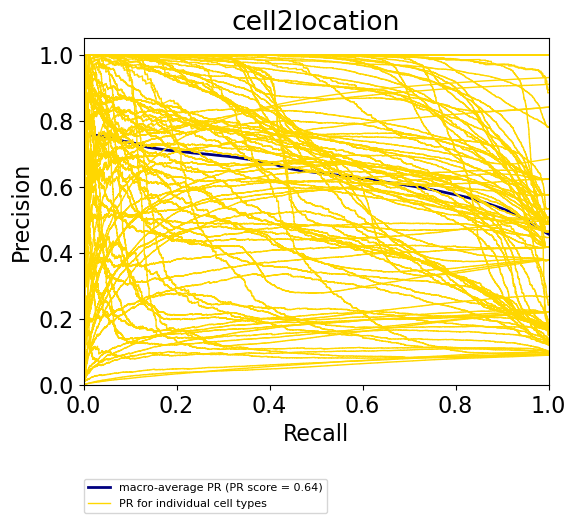

In [56]:
pos_cell_count = adata_vis_matching.obs[gold_standard.index].values
adata_vis_matching.obs[adata_vis_matching.uns['mod']['fact_names']] = adata_vis_matching.obs[[f'q05_spot_factors{i}' for i in adata_vis_matching.uns['mod']['fact_names']]]
cell2loc = adata_vis_matching.obs[adata_vis_matching.uns['mod']['fact_names']]
#cell2loc = (cell2loc.T / cell2loc.sum(1)).T
cell2loc = cell2loc[col_ind]

results = [cell2loc]
names = ['cell2location']

mpl.rc_file_defaults()
mpl.rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with mpl.rc_context({'figure.figsize': (6,5.5), 'font.size': 16}):
    plot_precision_recall(pos_cell_count, results[0], title=names[0], mode='macro')

In [57]:
pos_cell_count.sum(0)

array([ 9997., 11881., 11881., 11881., 11881., 11881.,  5512.,  4951.,
        4951.,  6015.,  5771.,  1884.,  1064.,  6332.,  5512.,  5512.,
        5512.,  5512.,  4951.,  4951.,  4951.,  4951.,  5512.,  5512.,
        5512.,  4951.,  5771.,  5771.,  1064.,  6835.,  1064.,  1064.,
        6835.,  1064.,  1064.,  1064.,  6835.,  1064.,  1064.,  6015.,
        1884.,  6835.,  6015.,  9262.,  1866.,  1866.,  4485.,  2619.,
        4485.,  2619.,  2619.,   561.,   561.,  1381.,  1381.,  1381.,
        1381.,  1064.,  7396., 11061.,  7396.,  6015.,  6015.,  1064.,
        1064.,  1064.,  1064.,  6332.,  1866.,  1866.,  1866.,  1884.,
        3180.,  2619.,  1866.,  1866.,  1866.,  1381.,  1866.,  7396.,
        6015.,  2619.,  4485.,  1866.,  4485.,  1381.,  5866.,  4485.,
        2619.,  1866.,  4951.,  7396., 10817., 11881.,  8131.,  4951.,
        9997., 11881., 11881., 11881., 11881., 11881., 11881., 11881.,
       11881., 11881.,  9262.,  5866.,  5866.,  5305.,  5866.,  2619.])

### Evaluating accuracy at excluding cell types anywhere in the region

In [58]:
l_names = ['thalamus', 'cortex', 'striatum', 'hypothalamus', 'amygdala', 'hippocampus']

# Define functions that compute per layer average abundance of each cell type & plot annotated scatterplot
def layer_distribution(slide, lay=None, layer_col='location', 
                       post_type='q05_spot_factors', l_names=l_names,
                       summary_fun=np.mean, proportion_per_layer=False):
    
    sel_clust_col = [post_type in i for i in slide.obs.columns]
    sel_clust_col = slide.obs.columns[sel_clust_col]
    from re import sub # create nice names
    sel_clust = [sub(post_type, '', i) for i in sel_clust_col]

    # log-transform and save with nice names
    #slides[s].obs[sel_clust] = np.log10(slides[s].obs[sel_clust_col])
    infer_lay_df = slide.obs[sel_clust_col]
    infer_lay_df.columns = sel_clust
    infer_lay_df = (infer_lay_df.T / infer_lay_df.sum(1)).T

    infer_lay = pd.DataFrame(index=sel_clust)
    for r in slide.obs[layer_col].unique():
        ind = slide.obs[layer_col].isin([r])
        # sum / mean of cell density across all spots within a region
        infer_lay[r] = summary_fun(infer_lay_df.loc[ind, :], axis=0)
    
    infer_lay = infer_lay[l_names]
    infer_lay.columns = l_names
    infer_lay = infer_lay.loc[infer_lay.sum(1) > 0, :]
    if lay is not None:
        infer_lay = infer_lay.loc[lay.index, :]
    infer_lay = infer_lay.loc[np.sort(list(infer_lay.index)), :]
    
    # convert to proportions per layer
    if proportion_per_layer is True:
        infer_lay = infer_lay / infer_lay.sum(0)
    
    return infer_lay

def plot_hist2d(x, y, xlab, ylab, log=False, scatter_kwdargs:dict={}):
    
    corr = np.corrcoef(
        x.values.flatten(), 
        y.values.flatten())[0,1]
    corr_log10 = np.corrcoef(
        np.log10(x.values.flatten() + 1), 
        np.log10(y.values.flatten() + 1))[0,1]

    if log:
        x = np.log10(x.values.flatten() + 1)
        y = np.log10(y.values.flatten() + 1)
        
        xlab = xlab + ' (log10)'
        ylab = ylab + ' (log10)'
    else:
        x = x.values.flatten()
        y = y.values.flatten()

    #plt.hist2d(x, y, bins=35, norm=matplotlib.colors.LogNorm());
    plt.scatter(x, y, **scatter_kwdargs);
    plt.xlabel(xlab);
    plt.ylabel(ylab);
    plt.xlim(0);
    plt.ylim(0);
    plt.title(r'$R^2$: ' \
              + str(np.round(corr, 3))\
              #+ r', $R^2$ log: '+ str(np.round(corr_log10, 3))
             );

Using the data from all animals

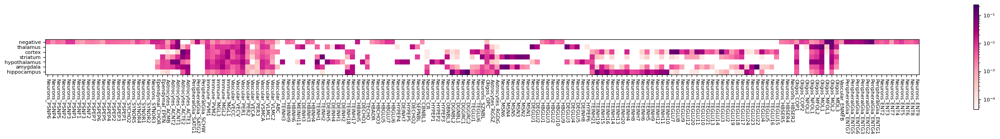

In [59]:
lay = count_df.copy() / count_df.sum(0)

rcParams["font.size"] = 8
rcParams["axes.facecolor"] = "white"
clustermap(lay.T, figure_size=(25, 3), 
           cmap='RdPu', log=True,
           cluster_rows=False, cluster_cols=False)

Using the layer map in one section

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


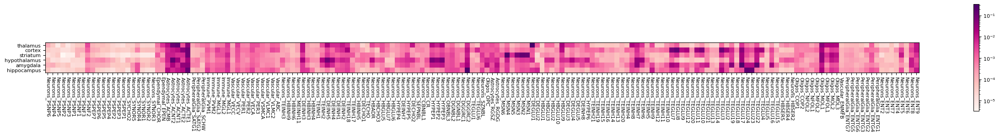

In [60]:
infer_lay_ST8059048 = layer_distribution(select_slide(adata_vis_matching, 'ST8059048').copy(), 
                                         summary_fun=np.mean, proportion_per_layer=False)
infer_lay_ST8059049 = layer_distribution(select_slide(adata_vis_matching, 'ST8059049').copy(), 
                                         summary_fun=np.mean, proportion_per_layer=False)
infer_lay_ST8059051 = layer_distribution(select_slide(adata_vis_matching, 'ST8059051').copy(), 
                                         summary_fun=np.mean, proportion_per_layer=False)
infer_lay_ST8059052 = layer_distribution(select_slide(adata_vis_matching, 'ST8059052').copy(), 
                                         summary_fun=np.mean, proportion_per_layer=False)

infer_lay_ST8059048 = infer_lay_ST8059048.loc[lay.index,:]
infer_lay_ST8059048 = infer_lay_ST8059048 / infer_lay_ST8059048.sum(0)

rcParams["font.size"] = 8
rcParams["axes.facecolor"] = "white"
clustermap(infer_lay_ST8059048.T, figure_size=(25, 3), 
           cmap='RdPu', log=True,
           cluster_rows=False, cluster_cols=False)

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


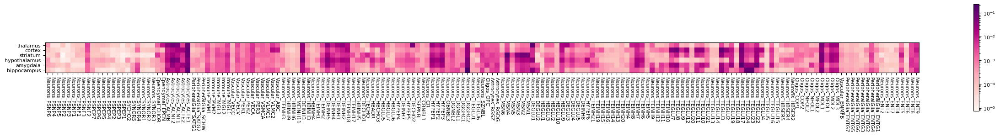

In [61]:
infer_lay_ST8059048 = layer_distribution(select_slide(adata_vis_matching, 'ST8059048').copy(), 
                                         summary_fun=lambda x, axis: np.quantile(x, 0.99, axis=axis), 
                                         proportion_per_layer=False)
infer_lay_ST8059049 = layer_distribution(select_slide(adata_vis_matching, 'ST8059049').copy(), 
                                         summary_fun=lambda x, axis: np.quantile(x, 0.99, axis=axis), 
                                         proportion_per_layer=False)
infer_lay_ST8059051 = layer_distribution(select_slide(adata_vis_matching, 'ST8059051').copy(),
                                         summary_fun=lambda x, axis: np.quantile(x, 0.99, axis=axis), 
                                         proportion_per_layer=False)
infer_lay_ST8059052 = layer_distribution(select_slide(adata_vis_matching, 'ST8059052').copy(),
                                         summary_fun=lambda x, axis: np.quantile(x, 0.99, axis=axis), 
                                         proportion_per_layer=False)

infer_lay_ST8059048 = infer_lay_ST8059048.loc[lay.index,:]
infer_lay_ST8059048 = infer_lay_ST8059048 / infer_lay_ST8059048.sum(0)

rcParams["font.size"] = 8
rcParams["axes.facecolor"] = "white"
clustermap(infer_lay_ST8059048.T, figure_size=(25, 3), 
           cmap='RdPu', log=True,
           cluster_rows=False, cluster_cols=False)

### Fig S Negative controls

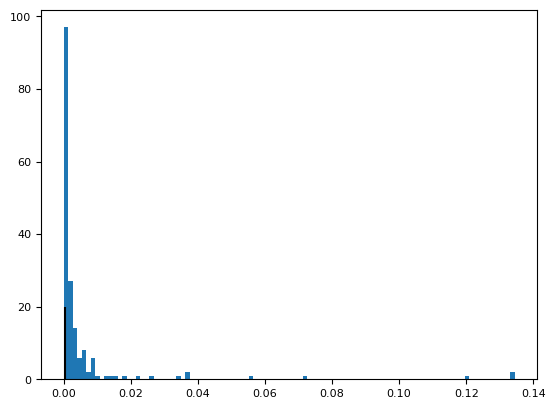

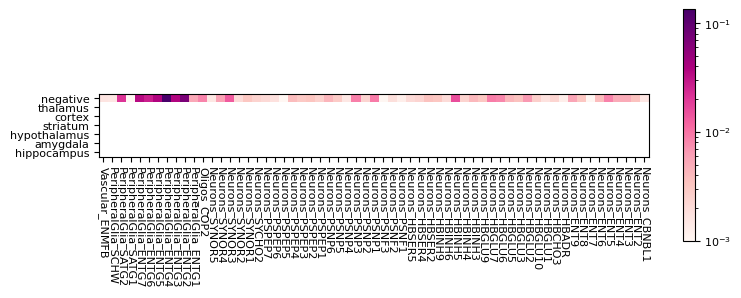

In [62]:
# selecting cell types very specific to PAR-POST-PRE compared to SSp
plt.hist(lay['negative'], bins=100);
plt.vlines(0.0005, 0, 20, color='black');
plt.show();

lay_negative = lay.loc[(lay[lay.columns[lay.columns != 'negative']].sum(1) == 0) \
                           & (lay['negative'] > 0.0005), :]
lay_negative = lay_negative.loc[np.sort(list(lay_negative.index)), :]

rcParams["font.size"] = 8
rcParams["axes.facecolor"] = "white"
clustermap(lay_negative.T, figure_size=(8, 3), 
           cmap='RdPu', log=True,
           cluster_rows=False, cluster_cols=False)

In [63]:
lay_negative.shape

(61, 7)

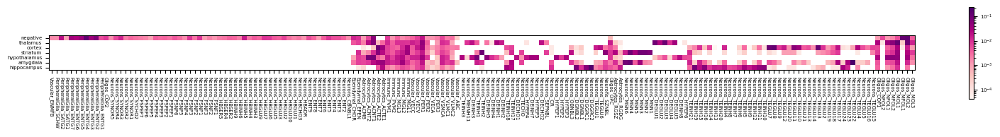

In [64]:
# reorder according to broad class
clearly_separated = [i for i in lay.index[~lay.index.isin(lay_negative.index)]] + [i for i in lay_negative.index]
lay = lay.loc[clearly_separated, ['negative'] + l_names]

lay_binary = lay > 0

rcParams["font.size"] = 5
rcParams["axes.facecolor"] = "white"
clustermap(lay.T, figure_size=(16, 1.8), 
           cmap='RdPu', log=True,
           cluster_rows=False, cluster_cols=False,
           #vmin=0.0003, vmax=1
          )
plt.savefig(f'{fig_path}Fig2J_suppl_Zeisel_negative_reference.pdf', bbox_inches='tight')
plt.show()

In [65]:
fig_path

'/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/zeisel/LocationModelLinearDependentWMultiExperiment_5experiments_175clusters_14968locations_12570genes_averages_matching_regions_30k/plots/figures/'

### considering both the accuracy in excluding negative cell types and correctly distinguishing between regional locations

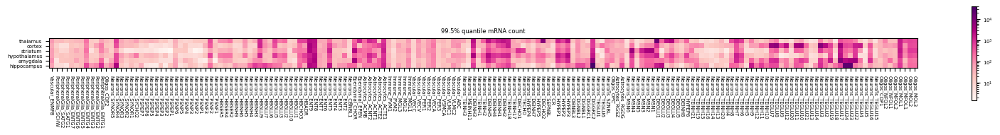

In [66]:
slide = adata_vis_matching.copy() #select_slide(adata_vis, 'ST8059048').copy()

sel_clust = lay_binary.index.values
post_type = 'q05_nUMI_factors'
layer_col = 'location'
sel_clust_col = [f'{post_type}{i}' for i in sel_clust]
infer_lay_df = slide.obs[sel_clust_col]
infer_lay_df.columns = sel_clust
#infer_lay_df = (infer_lay_df.T / infer_lay_df.sum(1)).T

infer_lay = pd.DataFrame(index=sel_clust)
for r in slide.obs[layer_col].unique():
    ind = slide.obs[layer_col].isin([r])
    # sum / mean of cell density across all spots within a region
    infer_lay[r] = np.quantile(infer_lay_df.loc[ind, :], 0.995, axis=0)
    

infer_lay_nUMI = infer_lay.copy()
infer_lay_nUMI = infer_lay_nUMI[l_names]

rcParams["font.size"] = 5
rcParams["axes.facecolor"] = "white"
clustermap(infer_lay_nUMI.T, figure_size=(16, 1.8), 
           cmap='RdPu', log=True,
           cluster_rows=False, cluster_cols=False,
           #vmin=40, vmax=10000
          )
plt.title('99.5% quantile mRNA count');
plt.savefig(f'{fig_path}Fig2J_suppl_Zeisel_negative_mRNA_counts_mapping.pdf', bbox_inches='tight')
plt.show()

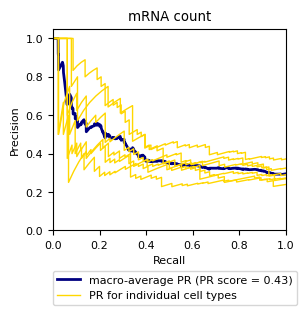

In [67]:
with mpl.rc_context({"figure.figsize": (3, 3.2),
                            'pdf.fonttype': 42, "font.size": 8}):
    gold_standard_lay = (count_df.copy() > 10)[l_names]
    gold_standard_lay = gold_standard_lay.loc[infer_lay_nUMI.index,:]
    
    plot_precision_recall(gold_standard_lay.values, infer_lay_nUMI[l_names],
                          title='mRNA count', mode='macro',
                         save=f'{fig_path}Fig2J_suppl_Zeisel_mRNA_count_negative_mapping_prec_recall.pdf'
                         )
    plt.show()

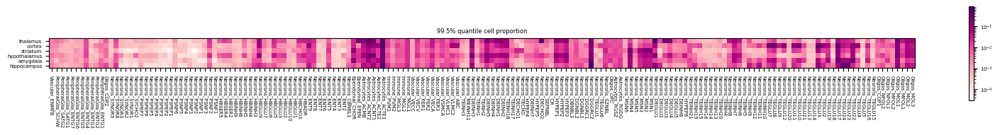

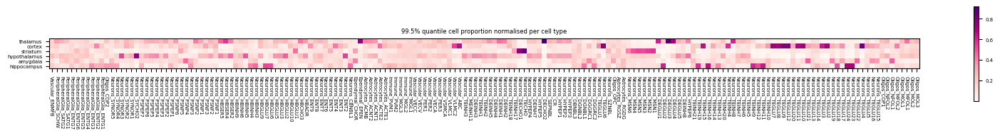

In [68]:
slide = adata_vis_matching.copy() #select_slide(adata_vis, 'ST8059048').copy()

sel_clust = lay_binary.index.values
post_type = 'q05_spot_factors'
layer_col = 'location'
sel_clust_col = [f'{post_type}{i}' for i in sel_clust]
infer_lay_df = slide.obs[sel_clust_col]
infer_lay_df.columns = sel_clust
infer_lay_df = (infer_lay_df.T / infer_lay_df.sum(1)).T

infer_lay = pd.DataFrame(index=sel_clust)
for r in slide.obs[layer_col].unique():
    ind = slide.obs[layer_col].isin([r])
    # sum / mean of cell density across all spots within a region
    infer_lay[r] = np.quantile(infer_lay_df.loc[ind, :], 0.995, axis=0)
    
infer_lay_nUMI = infer_lay.copy()
infer_lay_nUMI = infer_lay_nUMI[l_names]

rcParams["font.size"] = 5
rcParams["axes.facecolor"] = "white"
clustermap(infer_lay_nUMI.T, figure_size=(16, 1.8), 
           cmap='RdPu', log=True,
           cluster_rows=False, cluster_cols=False,
           #vmin=40, vmax=10000
          )
plt.title('99.5% quantile cell proportion');
plt.savefig(f'{fig_path}Fig2J_suppl_Zeisel_negative_cell_proportion_mapping.pdf', bbox_inches='tight')
plt.show()

rcParams["font.size"] = 5
rcParams["axes.facecolor"] = "white"
clustermap(infer_lay_nUMI.T / infer_lay_nUMI.T.sum(), figure_size=(16, 1.8), 
           cmap='RdPu', log=False,
           cluster_rows=False, cluster_cols=False,
           #vmin=40, vmax=10000
          )
plt.title('99.5% quantile cell proportion normalised per cell type');
plt.savefig(f'{fig_path}Fig2J_suppl_Zeisel_negative_cell_proportion_mapping_normalised.pdf', bbox_inches='tight')
plt.show()

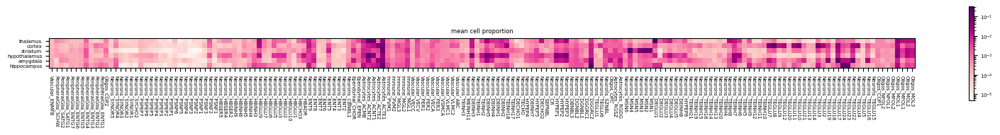

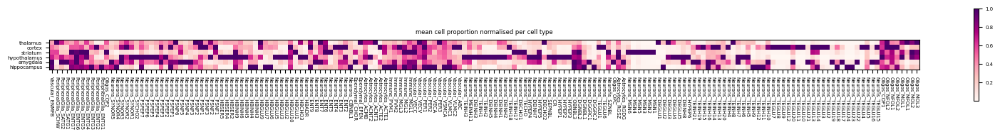

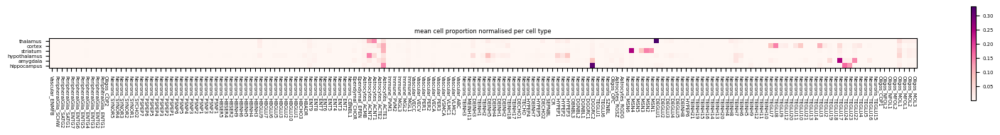

In [69]:
slide = adata_vis_matching.copy() #select_slide(adata_vis, 'ST8059048').copy()

sel_clust = lay_binary.index.values
post_type = 'q05_spot_factors'
layer_col = 'location'
sel_clust_col = [f'{post_type}{i}' for i in sel_clust]
infer_lay_df = slide.obs[sel_clust_col]
infer_lay_df.columns = sel_clust
infer_lay_df = (infer_lay_df.T / infer_lay_df.sum(1)).T

infer_lay = pd.DataFrame(index=sel_clust)
for r in slide.obs[layer_col].unique():
    ind = slide.obs[layer_col].isin([r])
    # sum / mean of cell density across all spots within a region
    infer_lay[r] = np.mean(infer_lay_df.loc[ind, :], axis=0)
    
infer_lay_nUMI = infer_lay.copy()
infer_lay_nUMI = infer_lay_nUMI[l_names]

rcParams["font.size"] = 5
rcParams["axes.facecolor"] = "white"
clustermap(infer_lay_nUMI.T, figure_size=(16, 1.8), 
           cmap='RdPu', log=True,
           cluster_rows=False, cluster_cols=False,
           #vmin=40, vmax=10000
          )
plt.title('mean cell proportion');
plt.savefig(f'{fig_path}Fig2J_suppl_Zeisel_negative_cell_proportion_mapping_mean.pdf', bbox_inches='tight')
plt.show()

rcParams["font.size"] = 5
rcParams["axes.facecolor"] = "white"
clustermap(infer_lay_nUMI.T / infer_lay_nUMI.T.max(), figure_size=(16, 1.8), 
           cmap='RdPu', log=False,
           cluster_rows=False, cluster_cols=False,
           #vmin=40, vmax=10000
          )
plt.title('mean cell proportion normalised per cell type');
plt.savefig(f'{fig_path}Fig2J_suppl_Zeisel_negative_cell_proportion_mapping_normalised_mean.pdf', bbox_inches='tight')
plt.show()

rcParams["font.size"] = 5
rcParams["axes.facecolor"] = "white"
clustermap(infer_lay_nUMI.T, figure_size=(16, 1.8), 
           cmap='RdPu', log=False,
           cluster_rows=False, cluster_cols=False,
           #vmin=40, vmax=10000
          )
plt.title('mean cell proportion normalised per cell type');
plt.savefig(f'{fig_path}Fig2J_suppl_Zeisel_negative_cell_proportion_mapping_mean_linear.pdf', bbox_inches='tight')
plt.show()

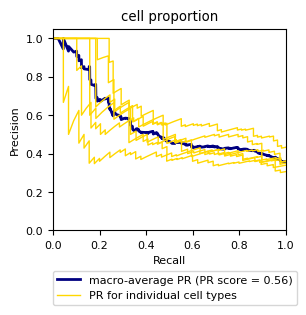

In [70]:
with mpl.rc_context({"figure.figsize": (3, 3.2),
                            'pdf.fonttype': 42, "font.size": 8}):
    gold_standard_lay = (count_df.copy() > 10)[l_names]
    gold_standard_lay = gold_standard_lay.loc[infer_lay_nUMI.index,:]
    plot_precision_recall(gold_standard_lay.values, infer_lay_nUMI[l_names],
                          title='cell proportion', mode='macro',
                         save=f'{fig_path}Fig2J_suppl_Zeisel_cell_proportion_negative_mapping_prec_recall.pdf'
                         )
    plt.show()

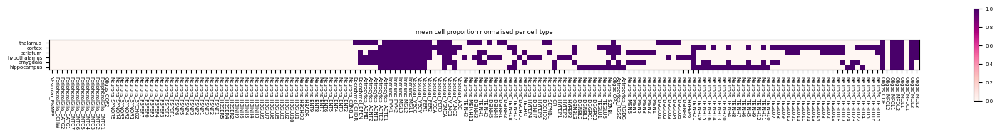

In [71]:
rcParams["font.size"] = 5
rcParams["axes.facecolor"] = "white"
clustermap(gold_standard_lay.T, figure_size=(16, 1.8), 
           cmap='RdPu', log=False,
           cluster_rows=False, cluster_cols=False,
           #vmin=40, vmax=10000
          )
plt.title('mean cell proportion normalised per cell type');
plt.savefig(f'{fig_path}Fig2J_suppl_Zeisel_negative_cell_proportion_mapping_normalised_gold_standard_binary.pdf', bbox_inches='tight')
plt.show()

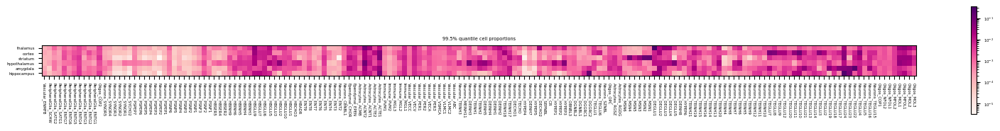

In [72]:
slide = adata_vis_matching.copy() #select_slide(adata_vis, 'ST8059048').copy()

sel_clust = lay_binary.index.values
post_type = 'RCTD_'
layer_col = 'location'
sel_clust_col = [f'{post_type}{i}' for i in sel_clust]
infer_lay_df = slide.obs[sel_clust_col]
infer_lay_df.columns = sel_clust
infer_lay_df = (infer_lay_df.T / infer_lay_df.sum(1)).T

RCTD = pd.DataFrame(index=sel_clust)
for r in slide.obs[layer_col].unique():
    ind = slide.obs[layer_col].isin([r])
    # sum / mean of cell density across all spots within a region
    RCTD[r] = np.mean(infer_lay_df.loc[ind, :], axis=0)
    
RCTD = RCTD.copy()
RCTD = RCTD[l_names]

#results = [RCTD]
#names = ['RCTD']

mpl.rc_file_defaults()
mpl.rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with mpl.rc_context({'font.size': 3.9, 'axes.facecolor': "white"}):
    clustermap(RCTD.T, figure_size=(16, 1.8), 
               cmap='RdPu', log=True,
               cluster_rows=False, cluster_cols=False,
               #vmin=0.001, vmax=1
              )
    plt.title('99.5% quantile cell proportions');
    #plt.savefig(f'{fig_path}Fig2J_suppl_PAR_POST_PRE_mapping.pdf', bbox_inches='tight')
    plt.show()

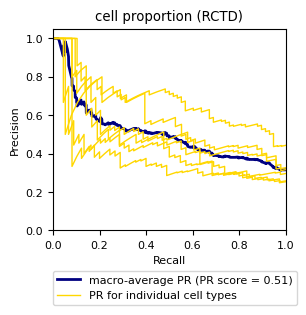

In [73]:
with mpl.rc_context({"figure.figsize": (3, 3.2),
                            'pdf.fonttype': 42, "font.size": 8}):
    gold_standard_lay = (count_df.copy() > 10)[l_names]
    gold_standard_lay = gold_standard_lay.loc[infer_lay_nUMI.index,:]
    plot_precision_recall(gold_standard_lay.values, RCTD[l_names],
                          title='cell proportion (RCTD)', mode='macro',
                         save=f'{fig_path}Fig2J_suppl_Zeisel_cell_proportion_negative_mapping_prec_recall_rctd.pdf'
                         )
    plt.show()

In [74]:
adata_vis_matching

AnnData object with n_obs × n_vars = 11881 × 31053
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'sample_name', 'sample_name2', 'image_name', 'slide', 'position', 'SSp_manual_layers', 'mean_spot_factorsAstrocytes_ACMB', 'mean_spot_factorsAstrocytes_ACNT1', 'mean_spot_factorsAstrocytes_ACNT2', 'mean_spot_factorsAstrocytes_ACTE1', 'mean_spot_factorsAstrocytes_ACTE2', 'mean_spot_factorsAstrocytes_RGDG', 'mean_spot_factorsAstrocytes_RGSZ', 'mean_spot_factorsEpendymal_CHOR', 'mean_spot_factorsEpendymal_EPEN', 'mean_spot_factorsImmune_MGL1', 'mean_spot_factorsImmune_MGL2', 'mean_spot_factorsImmune_MGL3', 'mean_spot_factorsImmune_PVM1', 'mean_spot_factorsImmune_PVM2', 'mean_spot_factorsNeurons_CBNBL1', 'mean_spot_factorsNeurons_CR', 'mean_spot_factorsNeurons_DECHO1

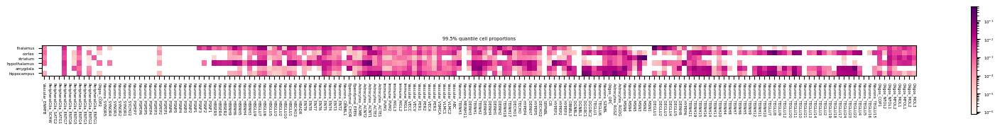

In [75]:
slide = adata_vis_matching.copy() #select_slide(adata_vis, 'ST8059048').copy()

sel_clust = lay_binary.index.values
post_type = 'Seurat_'
layer_col = 'location'
sel_clust_col = [f'{post_type}{i}' for i in sel_clust]
infer_lay_df = slide.obs[sel_clust_col]
infer_lay_df.columns = sel_clust
infer_lay_df = (infer_lay_df.T / infer_lay_df.sum(1)).T

Seurat = pd.DataFrame(index=sel_clust)
for r in slide.obs[layer_col].unique():
    ind = slide.obs[layer_col].isin([r])
    # sum / mean of cell density across all spots within a region
    Seurat[r] = np.mean(infer_lay_df.loc[ind, :], axis=0)
    
Seurat = Seurat.copy()
Seurat = Seurat[l_names]

#results = [Seurat]
#names = ['Seurat']

mpl.rc_file_defaults()
mpl.rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with mpl.rc_context({'font.size': 3.9, 'axes.facecolor': "white"}):
    clustermap(Seurat.T, figure_size=(16, 1.8), 
               cmap='RdPu', log=True,
               cluster_rows=False, cluster_cols=False,
               #vmin=0.001, vmax=1
              )
    plt.title('99.5% quantile cell proportions');
    #plt.savefig(f'{fig_path}Fig2J_suppl_PAR_POST_PRE_mapping.pdf', bbox_inches='tight')
    plt.show()

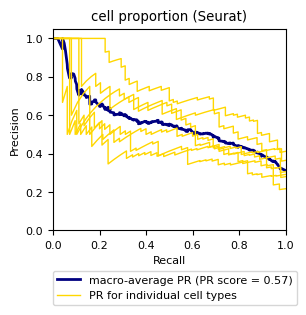

In [76]:
with mpl.rc_context({"figure.figsize": (3, 3.2),
                            'pdf.fonttype': 42, "font.size": 8}):
    gold_standard_lay = (count_df.copy() > 10)[l_names]
    gold_standard_lay = gold_standard_lay.loc[infer_lay_nUMI.index,:]
    plot_precision_recall(gold_standard_lay.values, Seurat[l_names],
                          title='cell proportion (Seurat)', mode='macro',
                         save=f'{fig_path}Fig2J_suppl_Zeisel_cell_proportion_negative_mapping_prec_recall_Seurat.pdf'
                         )
    plt.show()

#### Plot spatial 2d in the same order

clust_names_orig = ['q05_spot_factors' + i for i in infer_lay.index]
clust_names = infer_lay.index.astype(str)
adata_vis.obs[clust_names] = adata_vis.obs[clust_names_orig]

s = 'ST8059048'
s_ind = adata_vis.obs['sample'] == s
s_keys = list(adata_vis.uns['spatial'].keys())
s_spatial = np.array(s_keys)[[s in i for i in s_keys]][0]
        
mpl.rc_file_defaults()
mpl.rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with mpl.rc_context({'figure.figsize': (5,5)}):

    fig = sc.pl.spatial(adata_vis[s_ind, :], cmap='magma',
                                                color=clust_names, ncols=5, library_id=s_spatial,
                                                size=1, img_key='hires',
                                                alpha_img=1,
                                                vmin=0, vmax='p99.2',
                                                show=False,
                                                return_fig=True
                                                )
    fig.savefig(f"{fig_path}/histo_W_cell_density_q05_{s}.png", bbox_inches='tight')

In [78]:
adata_vis.obs[clust_names_orig].sum(1)

spot_id
ST8059048_AAACAAGTATCTCCCA-1     85.248336
ST8059048_AAACACCAATAACTGC-1     49.542709
ST8059048_AAACAGAGCGACTCCT-1    187.940360
ST8059048_AAACAGCTTTCAGAAG-1     31.577938
ST8059048_AAACAGGGTCTATATT-1     76.238205
                                   ...    
ST8059052_TTGTTCAGTGTGCTAC-1    103.357546
ST8059052_TTGTTGTGTGTCAAGA-1     62.136468
ST8059052_TTGTTTCACATCCAGG-1     14.408719
ST8059052_TTGTTTCCATACAACT-1     54.946865
ST8059052_TTGTTTGTGTAAATTC-1    128.611053
Length: 14968, dtype: float64

clust_names_orig = ['q05_spot_factors' + i for i in infer_lay.index]
clust_names = infer_lay.index.astype(str)
adata_vis.obs[clust_names] = (adata_vis.obs[clust_names_orig].T / adata_vis.obs[clust_names_orig].sum(1)).T

s = 'ST8059048'
s_ind = adata_vis.obs['sample'] == s
s_keys = list(adata_vis.uns['spatial'].keys())
s_spatial = np.array(s_keys)[[s in i for i in s_keys]][0]
        
mpl.rc_file_defaults()
mpl.rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with mpl.rc_context({'figure.figsize': (5,5)}):
    
    fig = sc.pl.spatial(adata_vis[s_ind, :], cmap='magma',
                                                color=clust_names, ncols=5, library_id=s_spatial,
                                                size=1, img_key='hires',
                                                alpha_img=1,
                                                vmin=0, vmax='p99.2',
                                                show=False,
                                                return_fig=True
                                                )
    fig.savefig(f"{fig_path}/histo_W_cell_proportion_q05_{s}.png", bbox_inches='tight')

### considering the accuracy in excluding negative cell types

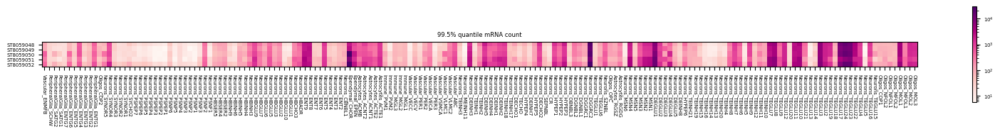

In [80]:
slide = adata_vis.copy() #select_slide(adata_vis, 'ST8059048').copy()

sel_clust = lay_binary.index.values
post_type = 'q05_nUMI_factors'
layer_col = 'sample'
sel_clust_col = [f'{post_type}{i}' for i in sel_clust]
infer_lay_df = slide.obs[sel_clust_col]
infer_lay_df.columns = sel_clust
#infer_lay_df = (infer_lay_df.T / infer_lay_df.sum(1)).T

infer_lay = pd.DataFrame(index=sel_clust)
for r in slide.obs[layer_col].unique():
    ind = slide.obs[layer_col].isin([r])
    # sum / mean of cell density across all spots within a region
    infer_lay[r] = np.quantile(infer_lay_df.loc[ind, :], 0.995, axis=0)
    

infer_lay_nUMI = infer_lay.copy()
#infer_lay_nUMI = infer_lay_nUMI[lay.columns[lay.columns != 'negative']]

rcParams["font.size"] = 5
rcParams["axes.facecolor"] = "white"
clustermap(infer_lay.T, figure_size=(16, 1.8), 
           cmap='RdPu', log=True,
           cluster_rows=False, cluster_cols=False,
           #vmin=40, vmax=10000
          )
plt.title('99.5% quantile mRNA count');
plt.savefig(f'{fig_path}Fig2J_suppl_Zeisel_negative_mRNA_counts_mapping_per_sample.pdf', bbox_inches='tight')
plt.show()

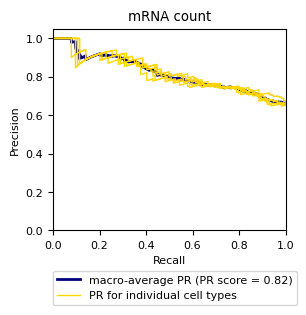

In [81]:
with mpl.rc_context({"figure.figsize": (3, 3.2),
                            'pdf.fonttype': 42, "font.size": 8}):
    
    lay_binary_pos = (lay[l_names].sum(1) > 0)[infer_lay_nUMI.index]
    gold_standard_lay = np.array([lay_binary_pos for i in range(infer_lay.shape[1])]).T
    
    plot_precision_recall(gold_standard_lay, infer_lay_nUMI,
                          title='mRNA count', mode='macro',
                         save=f'{fig_path}Fig2J_suppl_Zeisel_mRNA_count_negative_mapping_prec_recall_per_sample.pdf'
                         )
    plt.show()

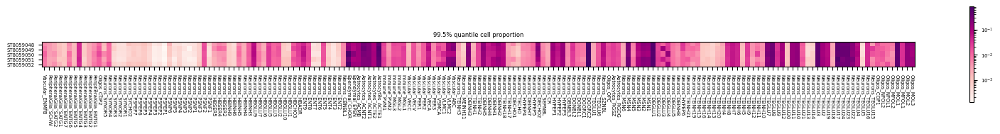

In [82]:
slide = adata_vis.copy() #select_slide(adata_vis, 'ST8059048').copy()

sel_clust = lay_binary.index.values
post_type = 'q05_spot_factors'
layer_col = 'sample'
sel_clust_col = [f'{post_type}{i}' for i in sel_clust]
infer_lay_df = slide.obs[sel_clust_col]
infer_lay_df.columns = sel_clust
infer_lay_df = (infer_lay_df.T / infer_lay_df.sum(1)).T

infer_lay = pd.DataFrame(index=sel_clust)
for r in slide.obs[layer_col].unique():
    ind = slide.obs[layer_col].isin([r])
    # sum / mean of cell density across all spots within a region
    infer_lay[r] = np.quantile(infer_lay_df.loc[ind, :], 0.995, axis=0)
    
infer_lay_nUMI = infer_lay.copy()

rcParams["font.size"] = 5
rcParams["axes.facecolor"] = "white"
clustermap(infer_lay.T, figure_size=(16, 1.8), 
           cmap='RdPu', log=True,
           cluster_rows=False, cluster_cols=False,
           #vmin=40, vmax=10000
          )
plt.title('99.5% quantile cell proportion');
plt.savefig(f'{fig_path}Fig2J_suppl_Zeisel_negative_cell_proportion_mapping_per_sample.pdf', bbox_inches='tight')
plt.show()

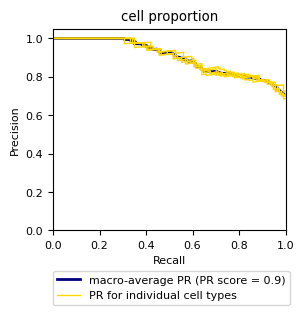

In [83]:
with mpl.rc_context({"figure.figsize": (3, 3.2),
                            'pdf.fonttype': 42, "font.size": 8}):
    lay_binary_pos = (lay[l_names].sum(1) > 0)[infer_lay_nUMI.index]
    gold_standard_lay = np.array([lay_binary_pos for i in range(infer_lay.shape[1])]).T
    
    plot_precision_recall(gold_standard_lay, infer_lay_nUMI,
                          title='cell proportion', mode='macro',
                         save=f'{fig_path}Fig2J_suppl_Zeisel_cell_proportion_negative_mapping_prec_recall_per_sample.pdf'
                         )
    plt.show()

In [84]:
! ~/gdrive upload --parent 1603xcjtEa_Q9vsCGjfgQhHJWV2fV2oix --recursive /nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/zeisel/LocationModelLinearDependentWMultiExperiment_5experiments_175clusters_14968locations_12570genes_matching_regions_30k

/bin/bash: /tmp/tmp.IIiZcZjnIj/gdrive: No such file or directory


Modules and their versions used for this analysis

In [85]:
import sys
for module in sys.modules:
    try:
        print(module,sys.modules[module].__version__)
    except:
        try:
            if  type(modules[module].version) is str:
                print(module,sys.modules[module].version)
            else:
                print(module,sys.modules[module].version())
        except:
            try:
                print(module,sys.modules[module].VERSION)
            except:
                pass

ipykernel 5.3.4
ipykernel._version 5.3.4
json 2.0.9
re 2.2.1
IPython 7.19.0
IPython.core.release 7.19.0
logging 0.5.1.2
zlib 1.0
traitlets 5.0.5
traitlets._version 5.0.5
argparse 1.1
ipython_genutils 0.2.0
ipython_genutils._version 0.2.0
platform 1.0.8
pygments 2.7.2
pexpect 4.8.0
ptyprocess 0.6.0
decorator 4.4.2
pickleshare 0.7.5
backcall 0.2.0
prompt_toolkit 3.0.8
wcwidth 0.2.5
jedi 0.17.2
parso 0.7.1
colorama 0.4.4
ctypes 1.1.0
_ctypes 1.1.0
urllib.request 3.7
jupyter_client 6.1.7
jupyter_client._version 6.1.7
zmq 20.0.0
zmq.backend.cython 40303
zmq.backend.cython.constants 40303
zmq.sugar 20.0.0
zmq.sugar.constants 40303
zmq.sugar.version 20.0.0
jupyter_core 4.7.0
jupyter_core.version 4.7.0
_curses b'2.2'
dateutil 2.8.1
six 1.15.0
decimal 1.70
_decimal 1.70
distutils 3.7.8
scanpy 1.6.0
numpy 1.19.4
numpy.core 1.19.4
numpy.core._multiarray_umath 3.1
numpy.lib 1.19.4
numpy.linalg._umath_linalg b'0.1.5'
scipy 1.5.3
scipy._lib._uarray 0.5.1+49.g4c3f1d7.scipy
anndata 0.7.5
anndata._meta